In [ ]:
# Imports
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm, ListedColormap
import pyfiglet
from numpy import mean

# Code for delta in print statements
delta = '\u0394' 

# Colour palette choice for graphing
palette = 'viridis'

# Colormapping for threshold of significance for dPCC (significance 1/6 for ctrl group n=11, will be diff for the various ctrl groups here)
my_colors = ['#440154FF', '#20A387FF', '#20A387FF', '#440154FF']
my_cmap = ListedColormap(my_colors)
bounds = [-1, -0.007, 0.007, 1]
my_norm = BoundaryNorm(bounds, ncolors=len(my_colors))
# Relatively aribtrarily chosen threshold for now, for thresholding the significance of individual dPCC values prior to averaging - only dead & upstaged rn
threshold = 0.006

pretreat_filename = 'merged_output.csv'
posttreat_filename = 'merged_output_posttreat.csv'
pretreat_unaveraged_filename = 'pretreat_pet_unaveraged_withnans.csv' # file with unaveraged regional data (e.g. all vertebrae), but includes some nan values
enhance_filename = '/Users/s2407021/icloud/PhD/Year_4/enhance/enhance_data_avg.csv'

# Column names for the datasets - needs to match the column names (and order) in the csv files
# I only put region names here, and then add my other desired columns (attributes, etc.) in the code when I read in the dataframes
organ_cols = ['clavicle', 'femur', 'humerus_left', 'humerus_right', 'scapula', 'skull', 'ribs_left', 'ribs_right', 'sternum', 
              'vertebra_cervical', 'vertebra_thoracic', 'vertebra_lumbar', 'hip', 'sacrum', 'adrenal_glands', 'kidneys', 'liver',
              'lung_lower_lobe_left', 'lung_lower_lobe_right', 'lung_middle_lobe_right', 'lung_upper_lobe_left', 
              'lung_upper_lobe_right', 'pancreas', 'spleen', 'stomach', 'thyroid', 'trachea']

# For bone-only analysis, read in only bone-region columns and ignore other regions
bone_cols = ['clavicle', 'femur', 'humerus_left', 'humerus_right', 'scapula', 'skull', 'ribs_left', 'ribs_right', 'sternum', 
              'vertebra_cervical', 'vertebra_thoracic', 'vertebra_lumbar', 'hip', 'sacrum']

bones_liver_cols = bone_cols + ['liver']

# I usually read in a file that has the average value per region (e.g. average of all vertebrae), but I also have a file with unaveraged regional data
unaveraged_organ_cols = ['clavicle_left', 'clavicle_right', 'femur_left', 'femur_right', 'humerus_left', 'humerus_right', 'scapula_left', 'scapula_right', 
                         'skull', 'rib_left_1', 'rib_left_2', 'rib_left_3', 'rib_left_4', 'rib_left_5', 'rib_left_6', 'rib_left_7', 'rib_left_8', 'rib_left_9',
                           'rib_left_10', 'rib_left_11', 'rib_left_12', 'rib_right_1', 'rib_right_2', 'rib_right_3', 'rib_right_4', 'rib_right_5', 'rib_right_6',
                            'rib_right_7', 'rib_right_8', 'rib_right_9', 'rib_right_10', 'rib_right_11', 'rib_right_12', 'sternum', 'vertebra_C1', 'vertebra_C2',
                            'vertebra_C3', 'vertebra_C4', 'vertebra_C5', 'vertebra_C6', 'vertebra_C7', 'vertebra_T1', 'vertebra_T2', 'vertebra_T3', 'vertebra_T4',
                            'vertebra_T5', 'vertebra_T6', 'vertebra_T7', 'vertebra_T8', 'vertebra_T9', 'vertebra_T10', 'vertebra_T11', 'vertebra_T12', 
                            'vertebra_L1', 'vertebra_L2', 'vertebra_L3', 'vertebra_L4', 'vertebra_L5', 'hip_left', 'hip_right', 'sacrum', 'adrenal_gland_left', 
                            'adrenal_gland_right', 'bladder', 'brain', 'gallbladder', 'kidney_left', 'kidney_right', 'liver', 'lung_lower_lobe_left', 
                            'lung_lower_lobe_right', 'lung_middle_lobe_right', 'lung_upper_lobe_left', 'lung_upper_lobe_right', 'pancreas', 'spleen', 
                            'stomach', 'thyroid_left', 'thyroid_right', 'trachea']

# For the ENHANCE dataset, which has slightly different regions/order
enhance_cols = ['clavicle', 'femur', 'humerus_left', 'humerus_right', 'scapula', 'skull', 'ribs_left', 'ribs_right', 'sternum', 
              'vertebra_cervical', 'vertebra_thoracic', 'vertebra_lumbar', 'hip', 'sacrum', 'adrenal_glands', 'kidneys', 'liver',
              'lung_lower_lobe_left', 'lung_lower_lobe_right', 'lung_middle_lobe_right', 'lung_upper_lobe_left', 
              'lung_upper_lobe_right', 'pancreas', 'spleen', 'stomach', 'thyroid']

In [ ]:
# All the functions which will be used throughout the notebook, which create the various dataframes, networks, and graphs. generally not hard-coded, minus some spots

# Function for getting a dataframe from a given filename. add_cols will be the various columns wanted for the specific 
# dataframe. I think this is easier than including all the patient/clinical info, because there's so much of it. 
# The added columns (add_cols) then become a multi-index, unless index_cols is specified to be something different.
def GetDF(filename, add_cols, bones_only, bones_liver=False, index_cols=False, drop_adrenals=True, drop_lungs=False, drop_empty=True, use_unaveraged=False, enhance=False): 
    if not index_cols: # option to set the index_columns specifically, otherwise it defaults to the added columns. see examples in usage below (PreTreat function)
        index_cols = add_cols
    if bones_liver: # Use the bone regions plus the liver
        usecols = bones_liver_cols + add_cols
        df = pd.read_csv(filename, sep=',', usecols=usecols, header=0)
    elif bones_only: # Use only the bone regions
        usecols = bone_cols + add_cols
        df = pd.read_csv(filename, sep=',', usecols=usecols, header=0)
    elif use_unaveraged: # Use the unaveraged regional data
        usecols = unaveraged_organ_cols + add_cols
        df = pd.read_csv(filename, sep=',', usecols=usecols, header=0)
    elif enhance: # Use the columns specific to the ENHANCE.PET dataset (which lacks trachea, etc.)
        usecols = enhance_cols + add_cols
        df = pd.read_csv(filename, sep=',', usecols=usecols, header=0)
    else: # Use all the organ regions
        usecols = organ_cols + add_cols
        df = pd.read_csv(filename, sep=',', usecols=usecols, header=0)
    df.set_index(index_cols, inplace=True) # Resets the index to be the added columns (or chosen index), which are usually attributes like Patient ID, Survival, etc.
    if filename == 'merged_output.csv': # Because the pre-treatment patients have an outlier in patient 183's femur
        if isinstance(df.index, pd.MultiIndex) and df.index.names[1] == "Patient ID": # This assumes Patient ID is second level of multiindex,
                                                                                    #  which is the convention I use always
            df = df.drop([183, 119], level=1) # Subject 183 has CT gone wrong (likely too soon after contrast CT) which caused issue with the Femur data.
                            # subject 119 has scan happening too soon after contrast CT
                            # Can comment out this line and go to "PCC vs SRCC" section in main and uncomment lines there to see it
        else: #If the dataframe doesn't have a multiindex, we assume the only index then is the Patient ID 
            df = df.drop([183, 119])
    if 'adrenal_glands' in df.columns and drop_adrenals: # auto drop adrenals b/c of extreme vmin/vmax values, due to poor segmentation
                                                        # see initial analyses that show this
        df = df.drop('adrenal_glands', axis=1)
    if drop_lungs: # if you choose to drop the lungs for an analysis, otherwise this is defaulted to False
        lung_cols = [col for col in df.columns if 'lung' in col]
        df = df.drop(lung_cols, axis=1)
    if drop_empty: # defaults to True
        # Filter out rows (subjects) where any data column has missing/empty values (NaN)
        df = df.dropna()
    return df

# Function for creating a reference network (or generic PCC network) from a group of 'controls', don't really need to do this as a function but I prefer it for ease
def Refnet(ctrls):
    return ctrls.corr(method='pearson')
        
# Function for creating a Spearman network from a group
def Spearman(ctrls):
    return ctrls.corr(method='spearman')

# Pearson and Spearman comparison - use above functions, plot, compare
def PCC_vs_SRCC(df):
    PCC_all = Refnet(df)
    SRCC_all = Spearman(df)

    fig, axes = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    
    sns.heatmap(PCC_all, vmin=0, vmax=1, cbar=True, yticklabels=True, ax=axes[0], cmap=palette)
    sns.heatmap(SRCC_all, vmin=0, vmax=1, cbar=False, yticklabels=True, ax=axes[1], cmap=palette)

    axes[0].set_title('PCC of all subjects')
    axes[1].set_title('Spearman of all subjects')
    plt.show()
    plt.close()

# Function for creating a list of resnets (dPCC networks) and an average resnet from dataframes of 'controls' and 'perturbations' 
def Perturbation(ctrls, refnet, perturbations):
    perturbation_list = perturbations.index.tolist()
    resnet_list=[]
    for subject in perturbation_list:
        ptb = ctrls.transpose().copy()
        ptb = ptb.assign(n_1=perturbations.transpose()[subject])
        ptbnet = ptb.transpose().corr(method='pearson').transpose()
        resnet = ptbnet-refnet
        resnet_list.append(resnet)
    avgresnet = sum(resnet_list) / len(resnet_list)
    avgresnet_stacked = avgresnet.stack()  # Save the stack for calculating vmin/vmax quickly
    vmin = avgresnet_stacked.min()
    vmax = avgresnet_stacked.max()
    print(f'Range of average {delta}PCC is ({vmin:.4f}, {vmax:.4f})')
    return resnet_list, avgresnet, vmin, vmax # Return a list of the single-subject dPCC networks and the avg dPCC networks

# Function for graphing some regional data (which is presumed to be a column of the dataframe) 
def Graph(df, region, ax=None):
    plot = df.plot(y=region, title=f'{region} data', ax=ax)
    (ax or plot).legend(bbox_to_anchor=(1.0, 1.0))
    return plot

# Function for creating a seaborn heatmap from a dataframe, works for PCC, dPCC, etc. 
def Heatmap(df, vmin, vmax, cbar, ax=None):
    return sns.heatmap(df, vmin=vmin, vmax=vmax, cbar=cbar, yticklabels=True, xticklabels=True, ax=ax, cmap=palette)

# Function for splitting a dataframe/getting out a small subset of df based on the index, so need to specify the desired multiindex order, 
# and then the group wanted (the group wanted must be part of index level 0 aka the first index in index_order)
def SplitDF(df, index_order, group):
    df_copy = df.copy()
    df_copy.sort_index(level=index_order, inplace=True)
    subset = df_copy.loc[[group]].droplevel(level=0)
    print(f"Number of {group} patients: {len(subset)}")
    return subset

In [ ]:
def PreTreat(filename): # defined function with everything I wanted to look at in the pre-treatment dataset, like a main function. can run on other data with adjustments
    df = GetDF(filename, ['CLINICAL STAGE', 'Patient ID'], bones_only=False, drop_adrenals=False) # Create the initial dataframe 

    # Compare PCC vs SRCC analysis
    PCC_vs_SRCC(df) 
    # Graph(df, 'femur') 
    # df = df.drop([183]) # Drop the femur outlier patient (this is done in GetDF now so be careful if un-commenting)
    Graph(df, 'femur', ax=None)

    # Graph some other regions to compare the data
    fig, ax = plt.subplots(1,2, figsize=(15, 5), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    Graph(df, 'kidneys', ax=ax[0])
    Graph(df, 'adrenal_glands', ax=ax[1])
    plt.show()
    plt.close()

    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    df_noadrenals = df.drop('adrenal_glands', axis=1)
    refnet_wadrenals = Refnet(df)
    refnet_noadrenals = Refnet(df_noadrenals)
    Heatmap(refnet_wadrenals, 0, 1, True, ax=ax[0])
    Heatmap(refnet_noadrenals, 0, 1, False, ax=ax[1])
    ax[0].set_title('PCC of all subjects')
    ax[1].set_title('PCC of all subjects - adrenal glands removed')
    plt.show()
    plt.close()

    # Currently just fully removing adrenals since they massively affect vmin/vmax of dPCC networks
    df = df.drop('adrenal_glands', axis=1) # In future, this is auto dropped in GetDF function, but just not here
                                            #since I was showing why it must be dropped in the above graph comparisons

    # Assess PCC within each group and dPCC across each group based on initial staging
    two_b = SplitDF(df, ['CLINICAL STAGE', 'Patient ID'], 'IIB')
    three_a = SplitDF(df, ['CLINICAL STAGE', 'Patient ID'], 'IIIA')
    three_b = SplitDF(df, ['CLINICAL STAGE', 'Patient ID'], 'IIIB')
    four = SplitDF(df, ['CLINICAL STAGE', 'Patient ID'], 'IV')

    fig, ax = plt.subplots(2,2, figsize=(15, 14), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    two_refnet = Refnet(two_b)
    three_a_refnet = Refnet(three_a)
    three_b_refnet = Refnet(three_b)
    four_refnet = Refnet(four)
    Heatmap(two_refnet, 0, 1, True, ax=ax[0,0])
    ax[0,0].set_title('PCC of IIB subjects')
    Heatmap(three_a_refnet, 0, 1, True, ax=ax[0,1])
    ax[0,1].set_title('PCC of IIIA subjects')
    Heatmap(three_b_refnet, 0, 1, True, ax=ax[1,0])
    ax[1,0].set_title('PCC of IIIB subjects')
    Heatmap(four_refnet, 0, 1, True, ax=ax[1,1])
    ax[1,1].set_title('PCC of IV subjects')
    plt.show()
    plt.close()

    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    threeab_resnet_list, threeab_avgresnet, vmin, vmax = Perturbation(three_a, three_a_refnet, three_b)
    Heatmap(threeab_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(threeab_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of IIIA vs. IIIB subjects')
    ax[1].set_title('abs('+delta+'PCC) of IIIA vs. IIIB subjects')
    plt.show()
    plt.close()

    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    two_four_resnet_list, two_four_avgresnet, vmin, vmax = Perturbation(two_b, two_refnet, four)
    Heatmap(two_four_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(two_four_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of IIB vs. IV subjects')
    ax[1].set_title('abs('+delta+'PCC) of IIB vs. IV subjects')
    plt.show()
    plt.close()

    three = pd.concat([three_a, three_b])
    three_refnet = Refnet(three)
    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    two_three_resnet_list, two_three_avgresnet, vmin, vmax = Perturbation(three, three_refnet, two_b)
    Heatmap(two_three_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(two_three_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of IIIA/IIIB vs. IIB subjects')
    ax[1].set_title('abs('+delta+'PCC) of IIIA/IIIB vs. IIB subjects')
    plt.show()
    plt.close()

    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    two_threea_resnet_list, two_threea_avgresnet, vmin, vmax = Perturbation(three_a, three_a_refnet, two_b)
    Heatmap(two_threea_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(two_threea_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of IIIA vs. IIB subjects')
    ax[1].set_title('abs('+delta+'PCC) of IIIA vs. IIB subjects')
    plt.show()
    plt.close()

    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    two_threeb_resnet_list, two_threeb_avgresnet, vmin, vmax = Perturbation(three_b, three_b_refnet, two_b)
    Heatmap(two_threeb_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(two_threeb_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of IIIB vs. IIB subjects')
    ax[1].set_title('abs('+delta+'PCC) of IIIB vs. IIB subjects')
    plt.show()
    plt.close()

    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    four_three_resnet_list, four_three_avgresnet, vmin, vmax = Perturbation(three, three_refnet, four)
    Heatmap(four_three_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(four_three_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of IIIA/IIIB vs. IV subjects')
    ax[1].set_title('abs('+delta+'PCC) of IIIA/IIIB vs. IV subjects')
    plt.show()
    plt.close()

    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    four_threea_resnet_list, four_threea_avgresnet, vmin, vmax = Perturbation(three_a, three_a_refnet, four)
    Heatmap(four_threea_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(four_threea_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of IIIA vs. IV subjects')
    ax[1].set_title('abs('+delta+'PCC) of IIIA vs. IV subjects')
    plt.show()
    plt.close()

    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    four_threeb_resnet_list, four_threeb_avgresnet, vmin, vmax = Perturbation(three_b, three_b_refnet, four)
    Heatmap(four_threeb_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(four_threeb_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of IIIB vs. IV subjects')
    ax[1].set_title('abs('+delta+'PCC) of IIIB vs. IV subjects')
    plt.show()
    plt.close()

    # Still comparing with staging but looking only at the bones and not all the other organs for a zoomed-in view
    bone_df = GetDF(filename, ['CLINICAL STAGE', 'Patient ID'], bones_only=True)
    three_a_bones = SplitDF(bone_df, ['CLINICAL STAGE', 'Patient ID'], 'IIIA')
    three_b_bones = SplitDF(bone_df, ['CLINICAL STAGE', 'Patient ID'], 'IIIB')
    three_a_bones_refnet = Refnet(three_a_bones)
    three_b_bones_refnet = Refnet(three_b_bones)
    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    Heatmap(three_a_bones_refnet, 0, 1, True, ax=ax[0])
    Heatmap(three_b_bones_refnet, 0, 1, False, ax=ax[1])
    ax[0].set_title('PCC of IIIA subjects, bones only')
    ax[1].set_title('PCC of IIIB subjects, bones only')
    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    threeab_bones_resnet_list, threeab_bones_avgresnet, vmin, vmax = Perturbation(three_a_bones, three_a_bones_refnet, three_b_bones)
    Heatmap(threeab_bones_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(threeab_bones_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of IIIA vs. IIIB subjects, bones only')
    ax[1].set_title('abs('+delta+'PCC) of IIIA vs. IIIB subjects, bones only')
    plt.show()
    plt.close()

    # Comparing across males vs. females
    sex_df = GetDF(filename, ['GENDER', 'Patient ID'], bones_only=False)
    males = SplitDF(sex_df, ['GENDER', 'Patient ID'], 'Male')
    females = SplitDF(sex_df, ['GENDER', 'Patient ID'], 'Female')
    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    males_refnet = Refnet(males)
    females_refnet = Refnet(females)
    Heatmap(males_refnet, 0, 1, True, ax=ax[0])
    Heatmap(females_refnet, 0, 1, False, ax=ax[1])
    ax[0].set_title('PCC of male subjects')
    ax[1].set_title('PCC of female subjects')
    plt.show()
    plt.close()
    sex_resnet_list, sex_avgresnet, vmin, vmax = Perturbation(males, males_refnet, females)
    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    Heatmap(sex_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(sex_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of males vs. females')
    ax[1].set_title('abs('+delta+'PCC) of males vs. females')
    plt.show()
    plt.close()

    # Comparing based on whether patients were upstaged later or not (bit iffy cause not all confirmed upstaged)
    upstaged_df = GetDF(filename, ['WAS DISEASE STATUS UPSTAGED BASED ON PET AND CONFIRMATORY STUDIES', 'Patient ID'], bones_only=False)
    not_upstaged = SplitDF(upstaged_df, ['WAS DISEASE STATUS UPSTAGED BASED ON PET AND CONFIRMATORY STUDIES', 'Patient ID'], 
                               'No[(complete Q1a, then  sign and date form)]')
    upstaged_conf_retro = SplitDF(upstaged_df, ['WAS DISEASE STATUS UPSTAGED BASED ON PET AND CONFIRMATORY STUDIES', 'Patient ID'], 
                                'Yes, confirmed in retrospect on previous CT/MRI scan[(complete Q1a - Q5)]')
    upstaged_conf_new = SplitDF(upstaged_df, ['WAS DISEASE STATUS UPSTAGED BASED ON PET AND CONFIRMATORY STUDIES', 'Patient ID'], 
                                'Yes, confirmed on additional directed CT/MRI scan <region of intrest>[(complete Q1a - Q5)]')
    upstaged_unconf = SplitDF(upstaged_df, ['WAS DISEASE STATUS UPSTAGED BASED ON PET AND CONFIRMATORY STUDIES', 'Patient ID'], 
                                'Yes, unconfirmed by additional imaging[(complete Q1a, then sign and date form)]')
    upstaged = pd.concat([upstaged_conf_retro, upstaged_conf_new, upstaged_unconf]) 
    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    not_upstaged_refnet = Refnet(not_upstaged)
    upstaged_refnet = Refnet(upstaged)
    Heatmap(not_upstaged_refnet, 0, 1, True, ax=ax[0])
    Heatmap(upstaged_refnet, 0, 1, False, ax=ax[1])
    ax[0].set_title('PCC of subjects that weren\'t upstaged')
    ax[1].set_title('PCC of subjects that were upstaged')
    plt.show()
    plt.close()
    upstaged_resnet_list, upstaged_avgresnet, vmin, vmax = Perturbation(not_upstaged, not_upstaged_refnet, upstaged)
    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    Heatmap(upstaged_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(upstaged_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of not upstaged vs. upstaged')
    ax[1].set_title('abs('+delta+'PCC) of not upstaged vs. upstaged')
    plt.show()
    plt.close()

    # Comparing based on whether or not patient survived over 2 years or not (compare to OG paper), not all patients have this info
    survival_df = GetDF(filename, ['Patient ID', 'Days from Base_dt to DATE OF LAST CLINICAL ASSESSMENT', 'PATIENT\'S VITAL STATUS'], 
                        bones_only=False, bones_liver=True, index_cols=['Patient ID'], drop_lungs=True, drop_adrenals=True)
    survival_df = survival_df.rename(columns={'Days from Base_dt to DATE OF LAST CLINICAL ASSESSMENT': 'days',
                                              "PATIENT\'S VITAL STATUS": 'status'})
    two_years = 365*2
    valid_statuses = ['Died <2 years', 'Lived >2 years', 'Lost to follow up, alive at last assessment']
    survival_df.loc[(survival_df['status'] == 'dead') & (survival_df['days'] < two_years), 'status'] = valid_statuses[0]
    survival_df.loc[(survival_df['status'] == 'dead') & (survival_df['days'] >= two_years), 'status'] = valid_statuses[1]
    survival_df.loc[((survival_df['status'] == 'alive') | (survival_df['status'] == 'lost to follow up')) & (survival_df['days'] >= two_years), 
                    'status'] = valid_statuses[1]
    survival_df.loc[((survival_df['status'] == 'alive') | (survival_df['status'] == 'lost to follow up')) & (survival_df['days'] < two_years),
                       'status'] = valid_statuses[2]
    survival_df = survival_df[survival_df['status'].isin(valid_statuses)]
    survival_days = survival_df[['days']].copy()

    # Comparing 10-20-30 longest lived patients to 10 shortest lived patients, and looking at the dPCC networks of those comparisons,
    #  and then also looking at the distribution of PCC values in the longest lived group
    # making sure 10 shortest lived patients are all in the "Died <2 years" group
    sizes=[10,20,30]
    fig, ax = plt.subplots(2,len(sizes), figsize=(15, 7), sharey=True, sharex=True)
    for index, n in enumerate(sizes):
        longest_lived = survival_df.nlargest(n, 'days')
        print(f"{n} longest lived patients (days): {longest_lived['days'].mean():.1f} ± {longest_lived['days'].std():.1f}")
        print(f"Patient IDs: {longest_lived.index.tolist()}")
        longest_lived = longest_lived.drop(columns=['days', 'status'])
        shortest_lived = survival_df[survival_df['status'] == valid_statuses[0]].nsmallest(10, 'days')
        print(f"10 shortest lived patients (days): {shortest_lived['days'].mean():.1f} ± {shortest_lived['days'].std():.1f}")
        print(f"Patient IDs: {shortest_lived.index.tolist()}")
        shortest_lived = shortest_lived.drop(columns=['days', 'status'])
        longest_lived_refnet = Refnet(longest_lived)
        shortest_lived_resnet_list, shortest_lived_avgresnet, vmin, vmax = Perturbation(longest_lived, longest_lived_refnet, shortest_lived)
        Heatmap(shortest_lived_avgresnet, vmin, vmax, True, ax=ax[0,index])
        Heatmap(abs(shortest_lived_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1,index])
        ax[0,index].set_title(delta+f'PCC of {n} longest vs. 10 shortest lived subjects')
        ax[1,index].set_title('abs('+delta+f'PCC) of above')
        mean = longest_lived_refnet.values.flatten().mean()
        std = longest_lived_refnet.values.flatten().std()
        print(f"{n} Longest Lived PCC Mean: {mean:.4f}, SD: {std:.4f} \n \n")
    plt.show()
    plt.close()

    #  Looking at the specific connections that are most different between the 30 longest lived and 10 shortest lived patients,
    #  using a threshold based on the correlation between dPCC and survival days 
    # (n=30 and PCC=0.74, so threshold is 0.036 since that's the r value that corresponds to a p value of 0.05 for n=30)
    threshold_30 = 0.03 #0.036 for n=30 and PCC=0.74
    region_counts = {}
    scan_counts = {}
    shortest_lived_resnet_masked_list = []
    fig, axes = plt.subplots(2,5, figsize=(20, 10), sharey=True, sharex=True)
    for iresnet, resnet in enumerate(shortest_lived_resnet_list):
        Heatmap(resnet, vmin=-threshold_30, vmax=threshold_30, cbar=False, ax=axes.flat[iresnet])
        mask = resnet.abs() > threshold_30
        masked_resnet = resnet.where(mask, other=0)
        for index in resnet.index:
            count_sum = mask.loc[index].sum()
            region_counts[index] = region_counts.get(index, 0) + count_sum
            count_any = mask.loc[index].any()
            scan_counts[index] = scan_counts.get(index, 0) + count_any
        shortest_lived_resnet_masked_list.append(masked_resnet)
    plt.suptitle(f'{delta}PCC of each 10 shortest lived subjects, no masking, cbar range (-{threshold_30}, {threshold_30})')
    fig.tight_layout()
    plt.show()
    plt.close()
    shortest_lived_avgresnet_masked = sum(shortest_lived_resnet_masked_list) / len(shortest_lived_resnet_masked_list)
    fig, ax = plt.subplots(figsize=(10, 7))
    masked_heatmap_corrected = sns.heatmap(shortest_lived_avgresnet_masked, cbar=True, yticklabels=True, xticklabels=True, annot=True, fmt='.2f', cmap=palette, ax=ax)
    plt.title('Average '+delta+f'PCC (thresholded at {threshold_30})')
    plt.show()
    plt.close()
    fig, ax = plt.subplots(1,2, figsize=(15, 7), sharey=True, gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    region_counts_barplot_df = pd.DataFrame(list(region_counts.items()), columns=['Region', 'Count'])
    region_counts_barplot_df.plot.bar(x='Region', y='Count', title=f'Number of connections per region with |{delta}PCC| > {threshold_30}', legend=False, ax=ax[0])
    scan_counts_barplot_df = pd.DataFrame(list(scan_counts.items()), columns=['Region', 'Count'])
    scan_counts_barplot_df.plot.bar(x='Region', y='Count', title=f'Number of scans per region with |{delta}PCC| > {threshold_30}', legend=False, ax=ax[1])
    ax[0].set_ylabel('Count')
    plt.show()
    plt.close()
    pd.Series(longest_lived_refnet.values.flatten()).hist(bins=20)
    plt.xlabel('PCC')
    plt.title('PCC Distribution of 30 longest lived')
    plt.show()
    plt.close()
    mean = longest_lived_refnet.values.flatten().mean()
    std = longest_lived_refnet.values.flatten().std()
    print(f"Mean: {mean:.4f}, SD: {std:.4f}")

    # making a weighted/normalized barplot to account for some regions having a lot of high dPCC values but not across a lot of patients
    weights = list(scan_counts.values())
    weighted_barplot_df = region_counts_barplot_df.copy()
    weighted_barplot_df['Weighted Count'] = weighted_barplot_df['Count'] * weights
    weighted_barplot_df['Probability Density'] = weighted_barplot_df['Weighted Count'] / weighted_barplot_df['Weighted Count'].sum()
    ax = weighted_barplot_df.plot.bar(x='Region', y='Probability Density', title='Weighted and Normalized', legend=False)
    ax.set_ylabel('Probability Density')
    plt.show()
    plt.close()

    # Back to the regularly scheduled survival df lived over/died under analysis
    survival_df = survival_df.drop(columns=['days']).set_index(['status'], append=True).reorder_levels(['status', 'Patient ID'])

    dead_under = SplitDF(survival_df, ['status', 'Patient ID'], valid_statuses[0])
    lived_over = SplitDF(survival_df, ['status', 'Patient ID'], valid_statuses[1])
    unsure = SplitDF(survival_df, ['status', 'Patient ID'], valid_statuses[2])
    lived_over_refnet = Refnet(lived_over)
    Heatmap(lived_over_refnet, 0, 1, True)
    plt.title('PCC of subjects who lived >2 years')
    plt.show()
    plt.close()

    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    survival_resnet_list, survival_avgresnet, vmin, vmax = Perturbation(lived_over, lived_over_refnet, dead_under)
    Heatmap(survival_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(survival_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of lived > vs. died < 2 years')
    ax[1].set_title('abs('+delta+'PCC) of lived > vs. died < 2 years')
    plt.show()
    plt.close()

    upstaged_dead = upstaged.loc[upstaged.index.intersection(dead_under.index)]
    upstaged_dead_ids = upstaged_dead.index.tolist()
    upstaged_dead_days = survival_days.loc[upstaged_dead_ids]['days'].tolist()
    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    subset_survival_resnet_list, subset_survival_avgresnet, vmin, vmax = Perturbation(lived_over, lived_over_refnet, upstaged_dead)
    Heatmap(subset_survival_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(subset_survival_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of lived > vs. died < 2 years & upstaged')
    ax[1].set_title('abs('+delta+'PCC) of lived > vs. died < 2 years & upstaged')
    plt.show()
    plt.close()

    fig, axes = plt.subplots(2, 4, sharey=True, sharex=True, figsize=(15, 7))
    masked_dfs = []
    for i, df in enumerate(subset_survival_resnet_list):
        mask = df.abs() > threshold
        filtered_df = df.where(mask, other=0)
        masked_dfs.append(filtered_df)
        df_stacked = df.stack()  # Cache the stack operation
        vmin = df_stacked.min()
        vmax = df_stacked.max()
        Heatmap(df, vmin, vmax, True, ax=axes.flat[i])
        axes.flat[i].set_title(f"Subject #{upstaged_dead_ids[i]} ({upstaged_dead_days[i]} days)")
    plt.suptitle(delta+'PCC of lived > vs. died < 2 years & upstaged - individual subjects')
    fig.tight_layout()
    plt.show()
    plt.close()

    fig, axes = plt.subplots(2, 4, sharey=True, sharex=True, figsize=(15, 7))
    for i, df in enumerate(subset_survival_resnet_list):
        Heatmap(df, -0.025, 0.025, True, ax=axes.flat[i])
        axes.flat[i].set_title(f"Subject #{upstaged_dead_ids[i]} ({upstaged_dead_days[i]} days)")
    plt.suptitle(delta+'PCC of lived > vs. died < 2 years & upstaged - individual subjects, set vmin/vmax')
    fig.tight_layout()
    plt.show()
    plt.close()
    # Now threshold each individual dPCC network prior to averaging
    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    avg_masked_resnet = sum(masked_dfs) / len(masked_dfs)
    Heatmap(avg_masked_resnet, -0.006, 0.004, True, ax=ax[0])
    ax[0].set_title('Average '+delta+'PCC after thresholding')
    Heatmap(abs(avg_masked_resnet), 0, max(abs(-0.006), 0.004), True, ax=ax[1])
    ax[1].set_title('Abs(average '+delta+'PCC after thresholding)')
    plt.show()
    plt.close()

In [ ]:
def PostTreat(filename): # defined function with everything I wanted to look at in the post-treatment dataset
    df = GetDF(filename, ['CLINICAL STAGE', 'Patient ID'], bones_only=False, drop_adrenals=False) # Create the initial dataframe 

    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    df_noadrenals = df.drop('adrenal_glands', axis=1)
    refnet_wadrenals = Refnet(df)
    refnet_noadrenals = Refnet(df_noadrenals)
    Heatmap(refnet_wadrenals, 0, 1, True, ax=ax[0])
    Heatmap(refnet_noadrenals, 0, 1, False, ax=ax[1])
    ax[0].set_title('PCC of all subjects')
    ax[1].set_title('PCC of all subjects - adrenal glands removed')
    plt.show()
    plt.close()

    # Assess PCC within each group and dPCC across each group based on initial staging
    two_b = SplitDF(df, ['CLINICAL STAGE', 'Patient ID'], 'IIB')
    three_a = SplitDF(df, ['CLINICAL STAGE', 'Patient ID'], 'IIIA')
    three_b = SplitDF(df, ['CLINICAL STAGE', 'Patient ID'], 'IIIB')
    # four = SplitDF(df, ['CLINICAL STAGE', 'Patient ID'], 'IV') # No stage IV patients in the post-treatment dataset

    fig, ax = plt.subplots(1,3, figsize=(15, 5), gridspec_kw={'width_ratios': [1, 1, 1]}, layout="constrained")
    two_refnet = Refnet(two_b)
    three_a_refnet = Refnet(three_a)
    three_b_refnet = Refnet(three_b)
    Heatmap(two_refnet, 0, 1, True, ax=ax[0])
    ax[0].set_title('PCC of IIB subjects')
    Heatmap(three_a_refnet, 0, 1, True, ax=ax[1])
    ax[1].set_title('PCC of IIIA subjects')
    Heatmap(three_b_refnet, 0, 1, True, ax=ax[2])
    ax[2].set_title('PCC of IIIB subjects')
    plt.show()
    plt.close()

    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    threeab_resnet_list, threeab_avgresnet, vmin, vmax = Perturbation(three_a, three_a_refnet, three_b)
    Heatmap(threeab_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(threeab_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of IIIA vs. IIIB subjects')
    ax[1].set_title('abs('+delta+'PCC) of IIIA vs. IIIB subjects')
    plt.show()
    plt.close()

    three = pd.concat([three_a, three_b])
    three_refnet = Refnet(three)
    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    two_three_resnet_list, two_three_avgresnet, vmin, vmax = Perturbation(three, three_refnet, two_b)
    Heatmap(two_three_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(two_three_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of IIIA/IIIB vs. IIB subjects')
    ax[1].set_title('abs('+delta+'PCC) of IIIA/IIIB vs. IIB subjects')
    plt.show()
    plt.close()

    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    two_threea_resnet_list, two_threea_avgresnet, vmin, vmax = Perturbation(three_a, three_a_refnet, two_b)
    Heatmap(two_threea_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(two_threea_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of IIIA vs. IIB subjects')
    ax[1].set_title('abs('+delta+'PCC) of IIIA vs. IIB subjects')
    plt.show()
    plt.close()

    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    two_threeb_resnet_list, two_threeb_avgresnet, vmin, vmax = Perturbation(three_b, three_b_refnet, two_b)
    Heatmap(two_threeb_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(two_threeb_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of IIIB vs. IIB subjects')
    ax[1].set_title('abs('+delta+'PCC) of IIIB vs. IIB subjects')
    plt.show()
    plt.close()

    # Still comparing with staging but looking only at the bones and not all the other organs for a zoomed-in view
    bone_df = GetDF(filename, ['CLINICAL STAGE', 'Patient ID'], bones_only=True)
    three_a_bones = SplitDF(bone_df, ['CLINICAL STAGE', 'Patient ID'], 'IIIA')
    three_b_bones = SplitDF(bone_df, ['CLINICAL STAGE', 'Patient ID'], 'IIIB')
    three_a_bones_refnet = Refnet(three_a_bones)
    three_b_bones_refnet = Refnet(three_b_bones)
    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    Heatmap(three_a_bones_refnet, 0, 1, True, ax=ax[0])
    Heatmap(three_b_bones_refnet, 0, 1, False, ax=ax[1])
    ax[0].set_title('PCC of IIIA subjects, bones only')
    ax[1].set_title('PCC of IIIB subjects, bones only')
    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    threeab_bones_resnet_list, threeab_bones_avgresnet, vmin, vmax = Perturbation(three_a_bones, three_a_bones_refnet, three_b_bones)
    Heatmap(threeab_bones_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(threeab_bones_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of IIIA vs. IIIB subjects, bones only')
    ax[1].set_title('abs('+delta+'PCC) of IIIA vs. IIIB subjects, bones only')
    plt.show()
    plt.close()

    # Comparing across males vs. females
    sex_df = GetDF(filename, ['GENDER', 'Patient ID'], bones_only=False)
    males = SplitDF(sex_df, ['GENDER', 'Patient ID'], 'Male')
    females = SplitDF(sex_df, ['GENDER', 'Patient ID'], 'Female')
    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    males_refnet = Refnet(males)
    females_refnet = Refnet(females)
    Heatmap(males_refnet, 0, 1, True, ax=ax[0])
    Heatmap(females_refnet, 0, 1, False, ax=ax[1])
    ax[0].set_title('PCC of male subjects')
    ax[1].set_title('PCC of female subjects')
    plt.show()
    plt.close()
    sex_resnet_list, sex_avgresnet, vmin, vmax = Perturbation(males, males_refnet, females)
    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    Heatmap(sex_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(sex_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of males vs. females')
    ax[1].set_title('abs('+delta+'PCC) of males vs. females')
    plt.show()
    plt.close()

    # Comparing based on whether patients were upstaged later or not (bit iffy cause not all confirmed upstaged)
    upstaged_df = GetDF(filename, ['WAS DISEASE STATUS UPSTAGED BASED ON PET AND CONFIRMATORY STUDIES', 'Patient ID'], bones_only=False)
    not_upstaged = SplitDF(upstaged_df, ['WAS DISEASE STATUS UPSTAGED BASED ON PET AND CONFIRMATORY STUDIES', 'Patient ID'], 
                               'No[(complete Q1a, then  sign and date form)]')
    upstaged_conf_retro = SplitDF(upstaged_df, ['WAS DISEASE STATUS UPSTAGED BASED ON PET AND CONFIRMATORY STUDIES', 'Patient ID'], 
                                'Yes, confirmed in retrospect on previous CT/MRI scan[(complete Q1a - Q5)]')
    upstaged_conf_new = SplitDF(upstaged_df, ['WAS DISEASE STATUS UPSTAGED BASED ON PET AND CONFIRMATORY STUDIES', 'Patient ID'], 
                                'Yes, confirmed on additional directed CT/MRI scan <region of intrest>[(complete Q1a - Q5)]')
    upstaged_unconf = SplitDF(upstaged_df, ['WAS DISEASE STATUS UPSTAGED BASED ON PET AND CONFIRMATORY STUDIES', 'Patient ID'], 
                                'Yes, unconfirmed by additional imaging[(complete Q1a, then sign and date form)]')
    upstaged = pd.concat([upstaged_conf_retro, upstaged_conf_new, upstaged_unconf]) 
    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    not_upstaged_refnet = Refnet(not_upstaged)
    upstaged_refnet = Refnet(upstaged)
    Heatmap(not_upstaged_refnet, 0, 1, True, ax=ax[0])
    Heatmap(upstaged_refnet, 0, 1, False, ax=ax[1])
    ax[0].set_title('PCC of subjects that weren\'t upstaged')
    ax[1].set_title('PCC of subjects that were upstaged')
    plt.show()
    plt.close()
    upstaged_resnet_list, upstaged_avgresnet, vmin, vmax = Perturbation(not_upstaged, not_upstaged_refnet, upstaged)
    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    Heatmap(upstaged_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(upstaged_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of not upstaged vs. upstaged')
    ax[1].set_title('abs('+delta+'PCC) of not upstaged vs. upstaged')
    plt.show()
    plt.close()

    # Comparing based on whether or not patient survived over 2 years or not (compare to OG paper), not all patients have this info
    survival_df = GetDF(filename, ['Patient ID', 'Days from Base_dt to DATE OF LAST CLINICAL ASSESSMENT', 'PATIENT\'S VITAL STATUS'], 
                                 bones_only=True, index_cols=['Patient ID'])
    survival_df = survival_df.rename(columns={'Days from Base_dt to DATE OF LAST CLINICAL ASSESSMENT': 'days',
                                              'PATIENT\'S VITAL STATUS': 'status'})
    two_years = 365*2
    valid_statuses = ['Died <2 years', 'Lived >2 years', 'Lost to follow up, alive at last assessment']
    survival_df.loc[(survival_df['status'] == 'dead') & (survival_df['days'] < two_years),'status'] = valid_statuses[0]
    survival_df.loc[(survival_df['status'] == 'dead') & (survival_df['days'] >= two_years), 'status'] = valid_statuses[1]
    survival_df.loc[((survival_df['status'] == 'alive') | (survival_df['status'] == 'lost to follow up')) & (survival_df['days'] >= two_years), 
                    'status'] = valid_statuses[1]
    survival_df.loc[((survival_df['status'] == 'alive') | (survival_df['status'] == 'lost to follow up')) & (survival_df['days'] < two_years),
                       'status'] = valid_statuses[2]
    survival_df = survival_df[survival_df['status'].isin(valid_statuses)]
    survival_df = survival_df.drop(columns=['days']).set_index(['status'], append=True).reorder_levels(['status', 'Patient ID'])

    dead_under = SplitDF(survival_df, ['status', 'Patient ID'], valid_statuses[0])
    lived_over = SplitDF(survival_df, ['status', 'Patient ID'], valid_statuses[1])
    unsure = SplitDF(survival_df, ['status', 'Patient ID'], valid_statuses[2])
    lived_over_refnet = Refnet(lived_over)
    Heatmap(lived_over_refnet, 0, 1, True)
    plt.title('PCC of subjects who lived >2 years')
    plt.show()
    plt.close()

    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    survival_resnet_list, survival_avgresnet, vmin, vmax = Perturbation(lived_over, lived_over_refnet, dead_under)
    Heatmap(survival_avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(survival_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of lived > vs. died < 2 years')
    ax[1].set_title('abs('+delta+'PCC) of lived > vs. died < 2 years')
    plt.show()
    plt.close()

 ____               _____               _                        _   
|  _ \ _ __ ___    |_   _| __ ___  __ _| |_ _ __ ___   ___ _ __ | |_ 
| |_) | '__/ _ \_____| || '__/ _ \/ _` | __| '_ ` _ \ / _ \ '_ \| __|
|  __/| | |  __/_____| || | |  __/ (_| | |_| | | | | |  __/ | | | |_ 
|_|   |_|  \___|     |_||_|  \___|\__,_|\__|_| |_| |_|\___|_| |_|\__|
                                                                     
 ____                       _                _           _     
/ ___|  ___ __ _ _ __      / \   _ __   __ _| |_   _ ___(_)___ 
\___ \ / __/ _` | '_ \    / _ \ | '_ \ / _` | | | | / __| / __|
 ___) | (_| (_| | | | |  / ___ \| | | | (_| | | |_| \__ \ \__ \
|____/ \___\__,_|_| |_| /_/   \_\_| |_|\__,_|_|\__, |___/_|___/
                                               |___/           



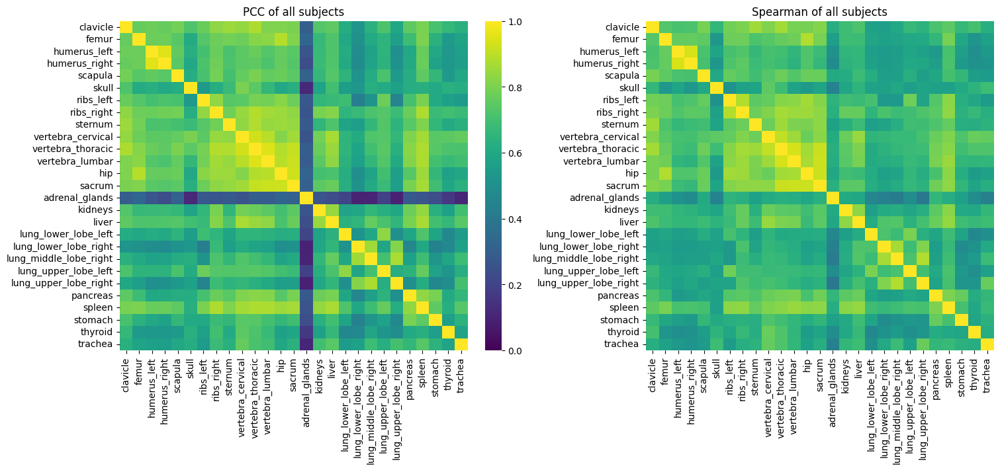

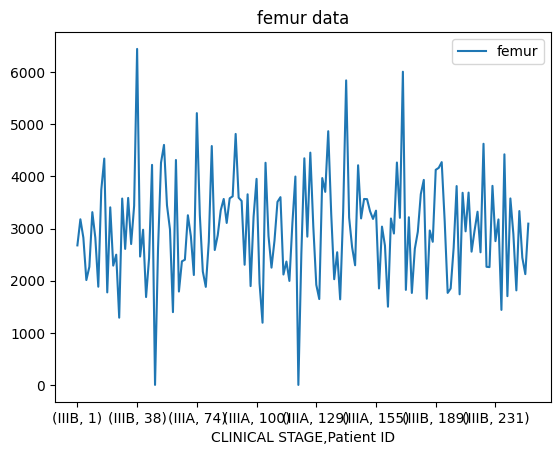

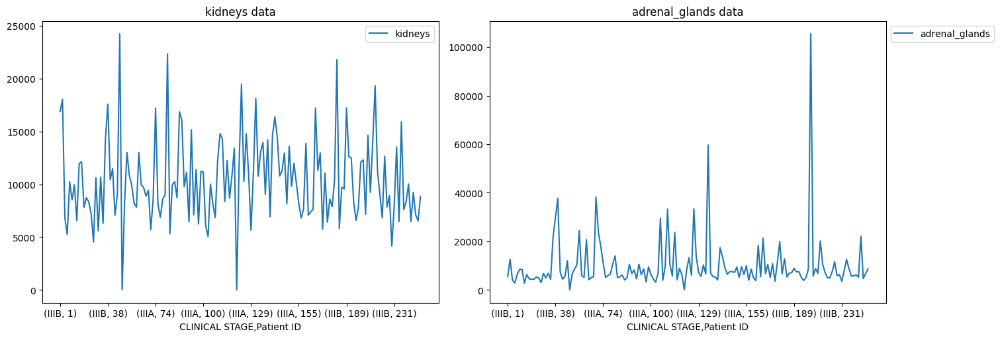

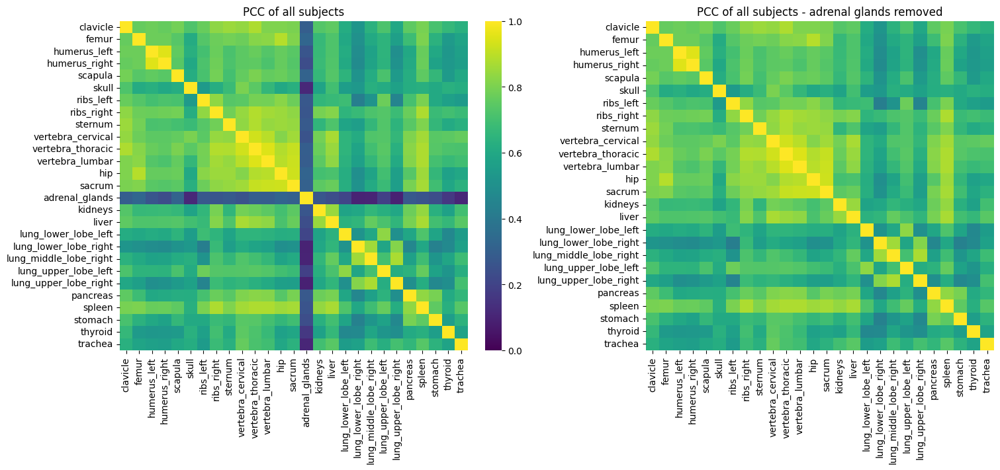

Number of IIB patients: 7
Number of IIIA patients: 80
Number of IIIB patients: 63
Number of IV patients: 1


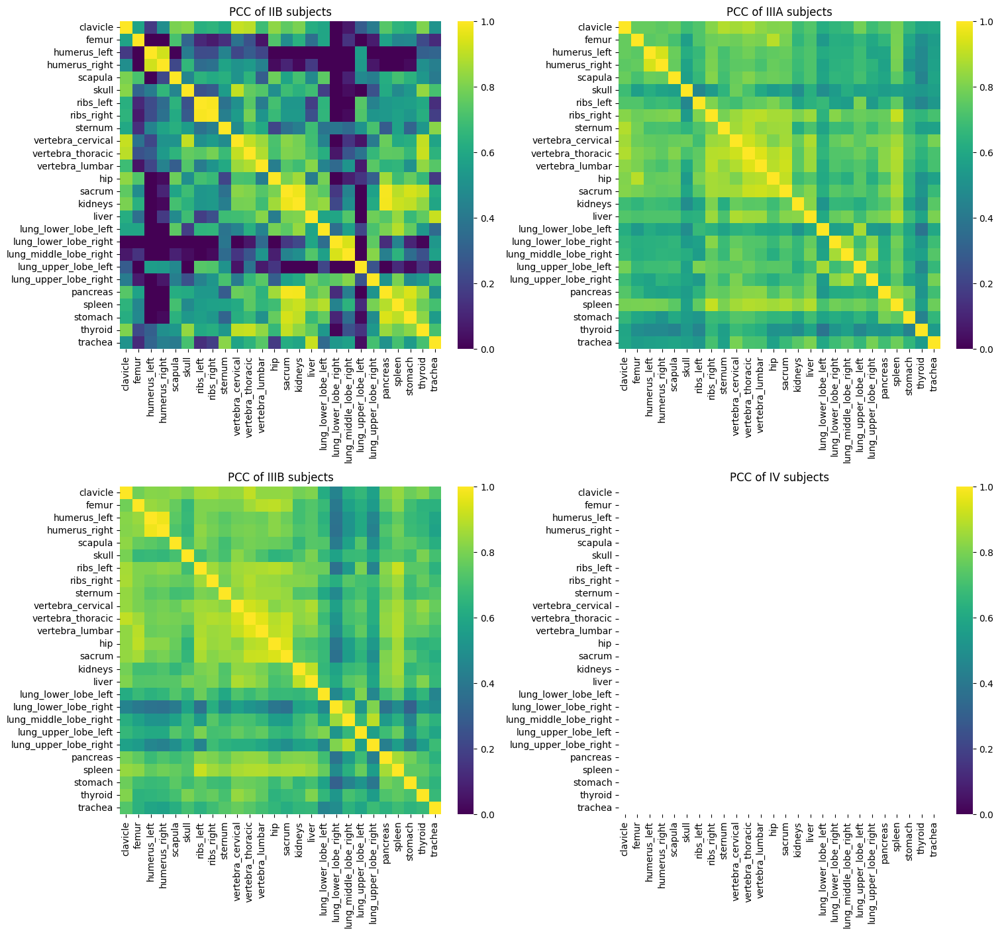

Range of average ΔPCC is (-0.0063, 0.0026)


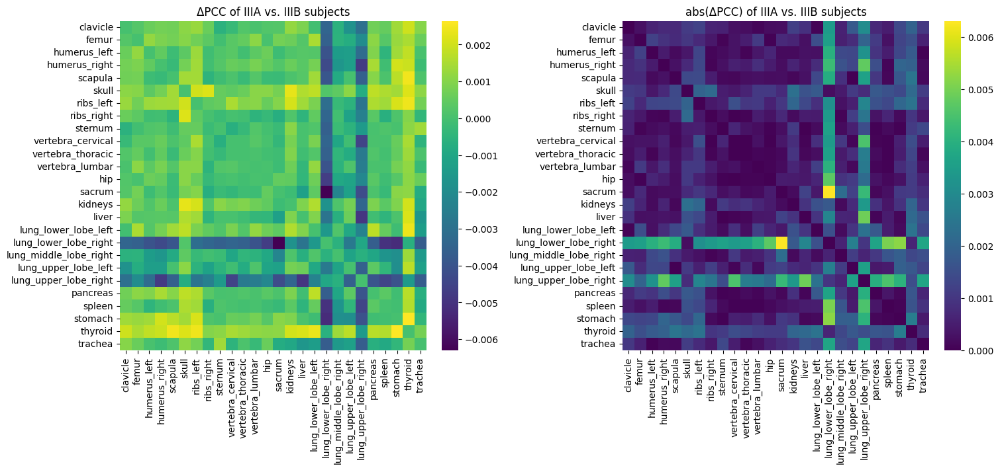

Range of average ΔPCC is (-0.2767, 0.8667)


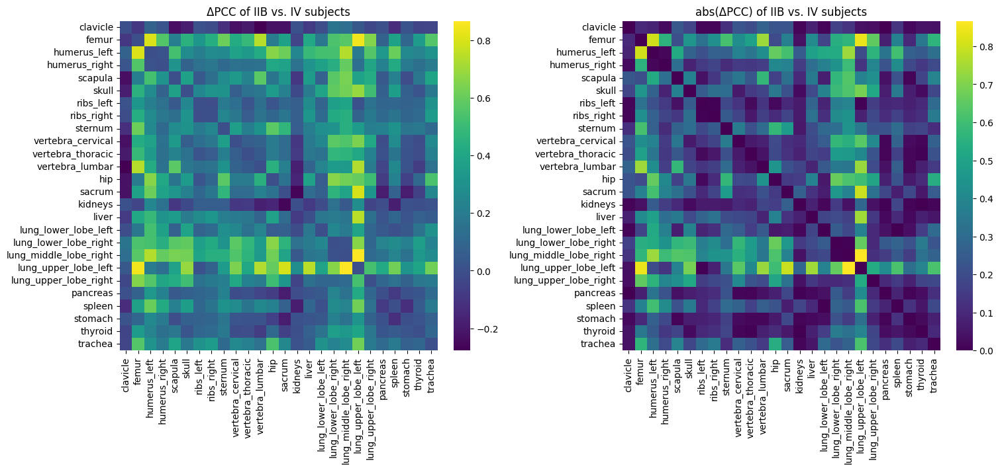

Range of average ΔPCC is (-0.0040, 0.0025)


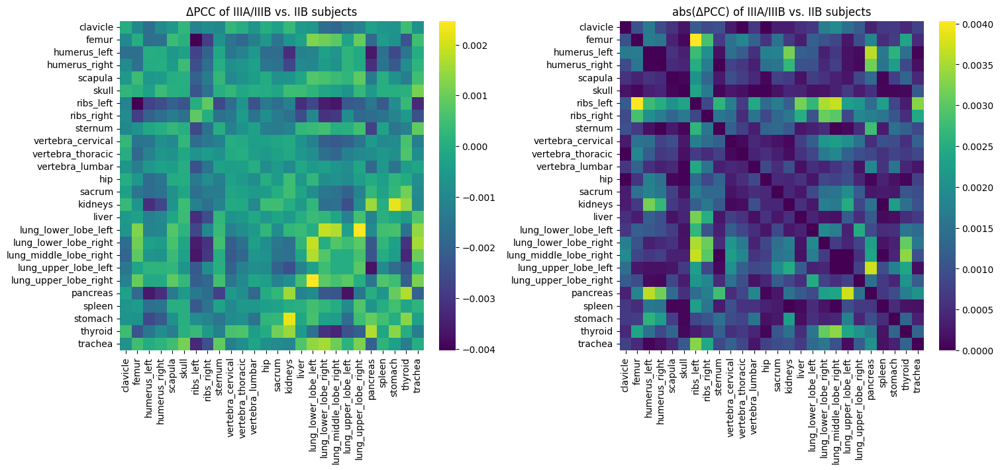

Range of average ΔPCC is (-0.0077, 0.0047)


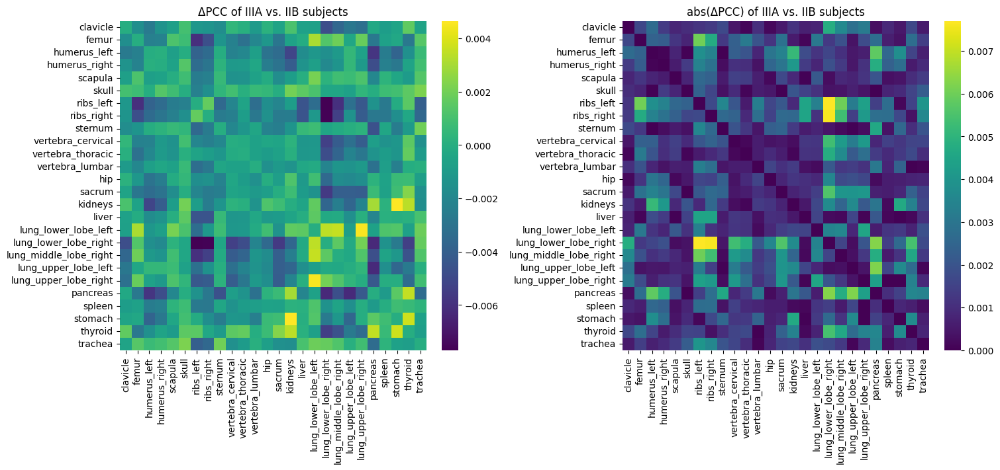

Range of average ΔPCC is (-0.0123, 0.0048)


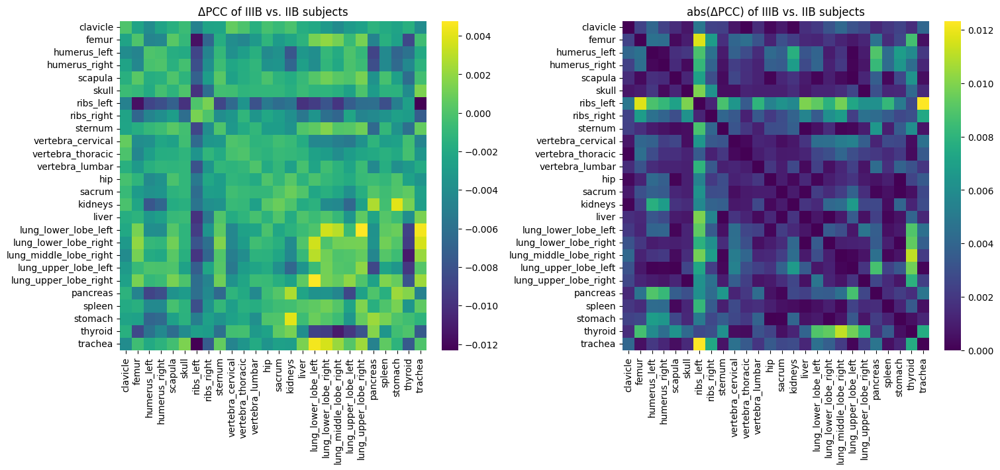

Range of average ΔPCC is (-0.0217, 0.0158)


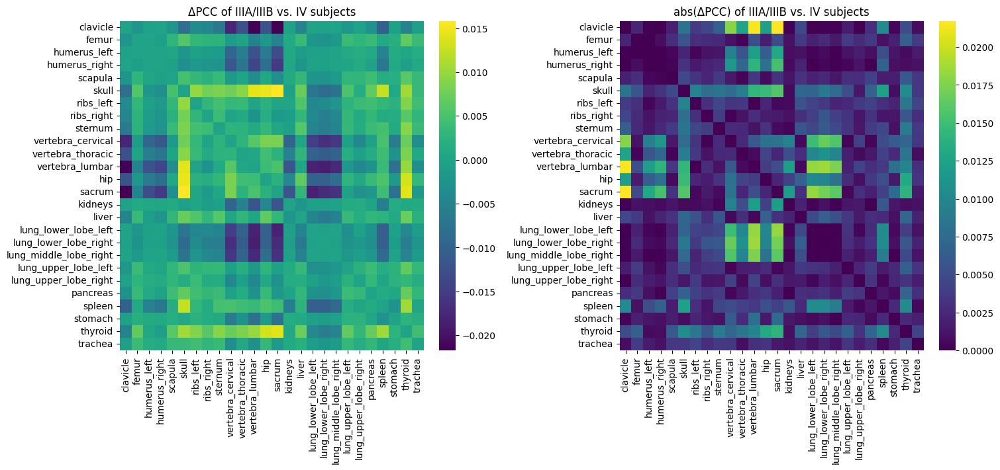

Range of average ΔPCC is (-0.0437, 0.0275)


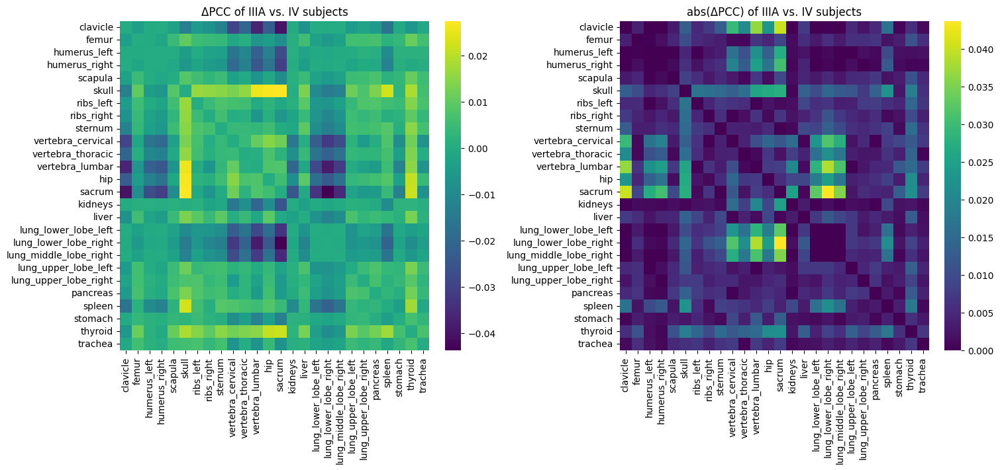

Range of average ΔPCC is (-0.0461, 0.0325)


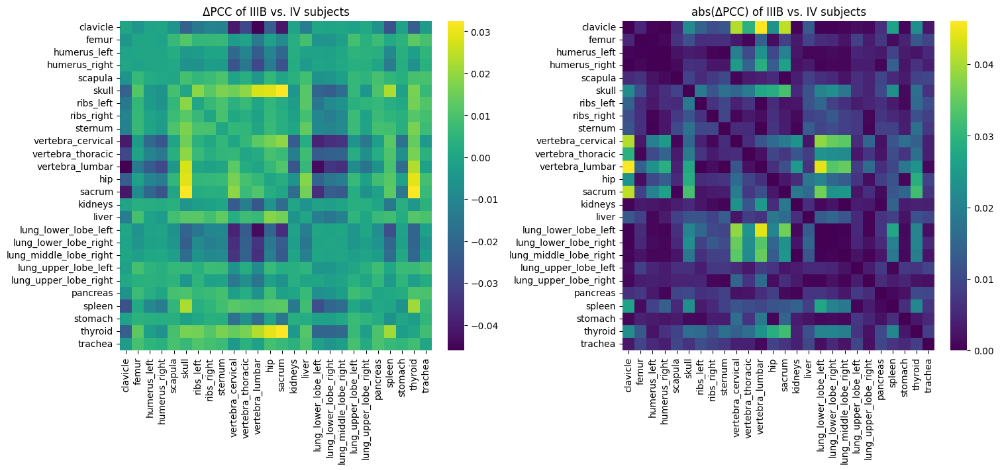

Number of IIIA patients: 82
Number of IIIB patients: 64
Range of average ΔPCC is (-0.0006, 0.0020)


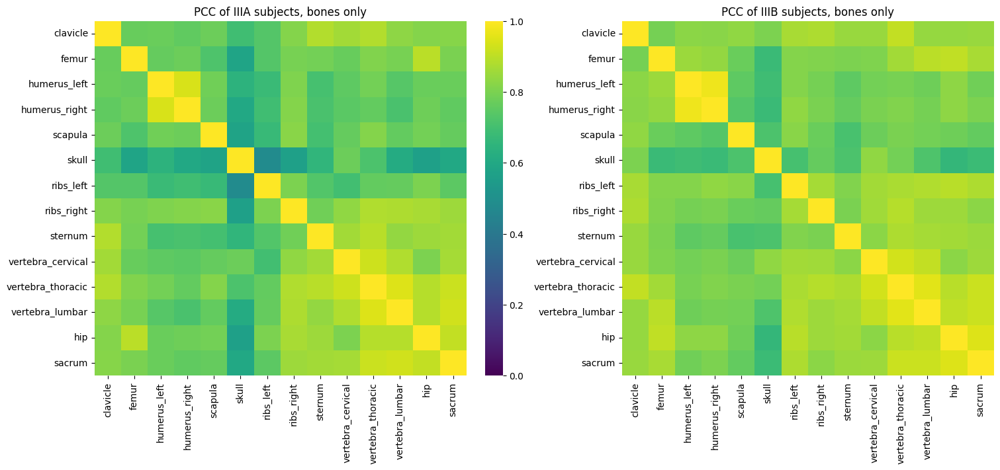

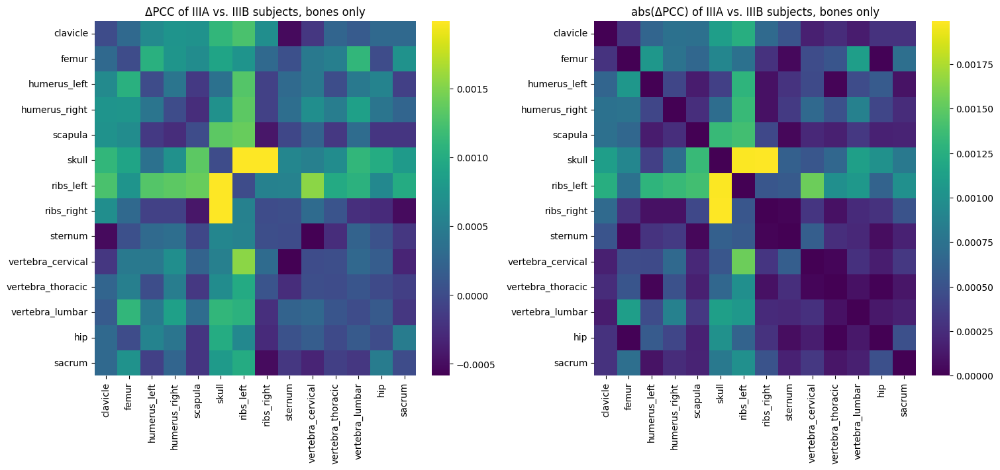

Number of Male patients: 101
Number of Female patients: 51


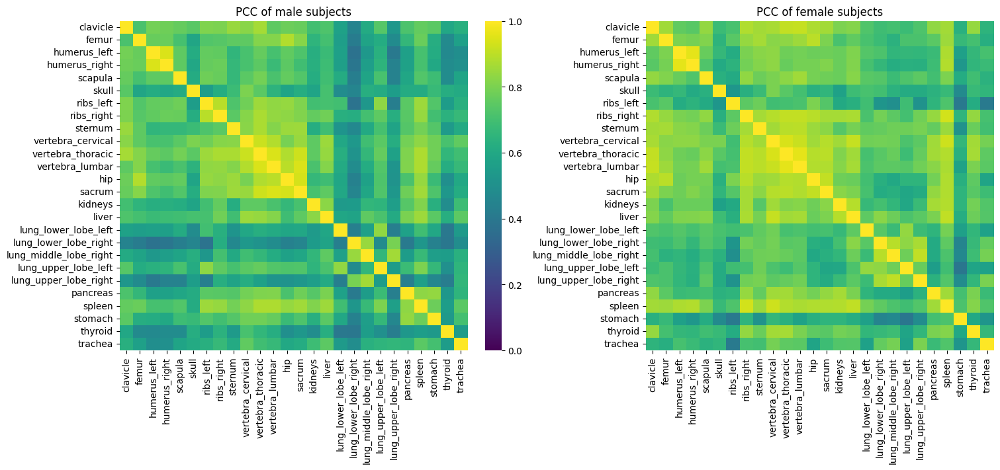

Range of average ΔPCC is (-0.0035, 0.0029)


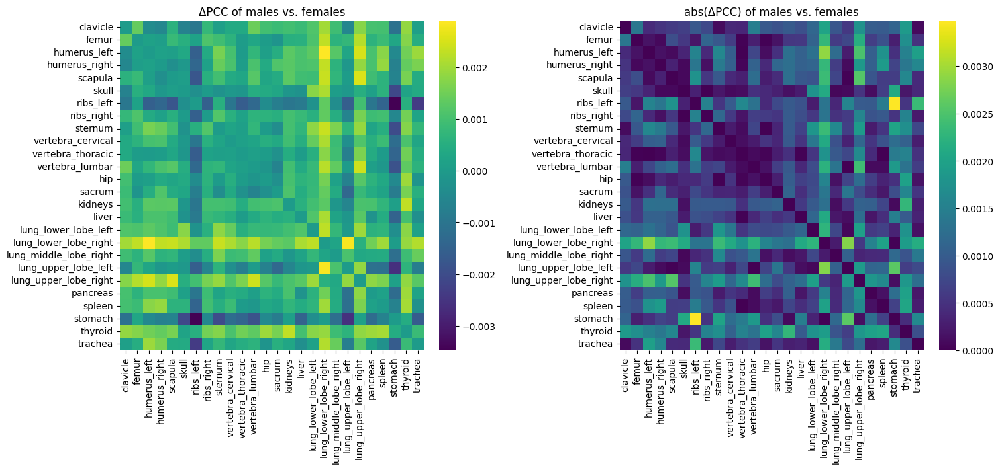

Number of No[(complete Q1a, then  sign and date form)] patients: 131
Number of Yes, confirmed in retrospect on previous CT/MRI scan[(complete Q1a - Q5)] patients: 4
Number of Yes, confirmed on additional directed CT/MRI scan <region of intrest>[(complete Q1a - Q5)] patients: 6
Number of Yes, unconfirmed by additional imaging[(complete Q1a, then sign and date form)] patients: 8


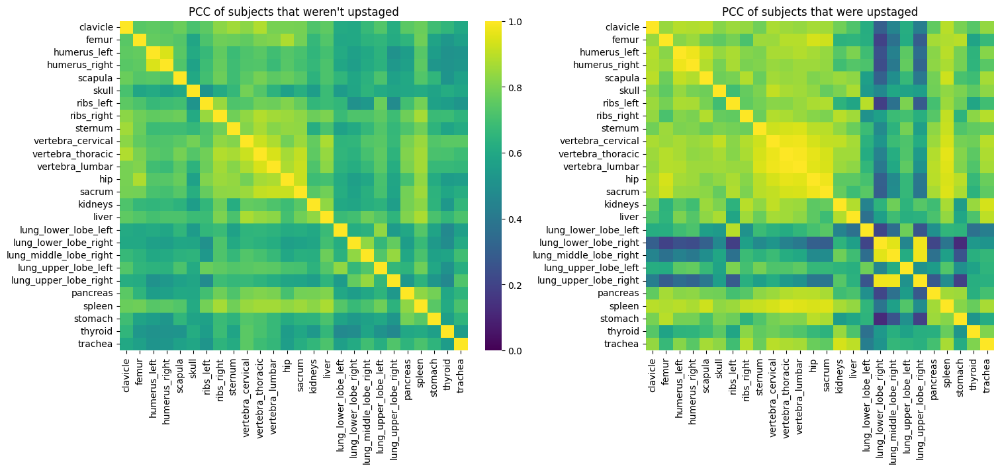

Range of average ΔPCC is (-0.0070, 0.0036)


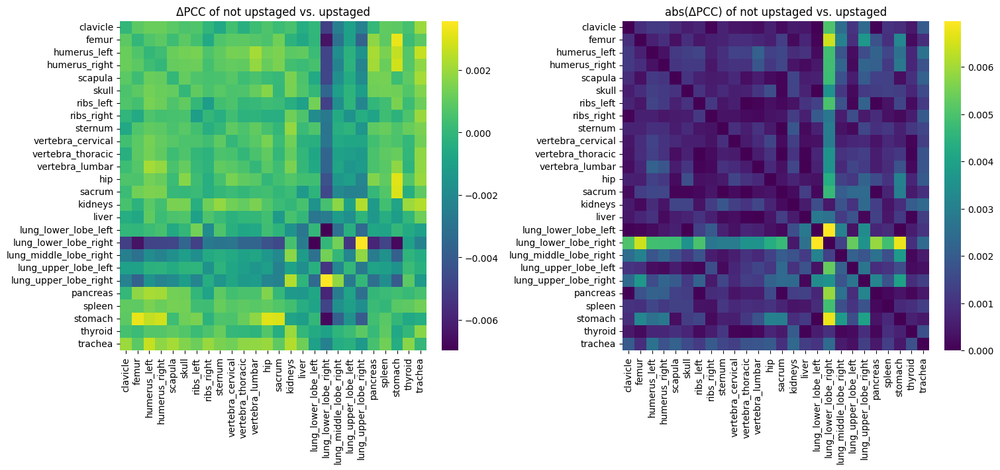

10 longest lived patients (days): 2034.9 ± 200.9
Patient IDs: [22, 26, 12, 35, 43, 77, 41, 69, 39, 89]
10 shortest lived patients (days): 53.6 ± 26.7
Patient IDs: [208, 190, 10, 212, 141, 64, 216, 251, 171, 59]
Range of average ΔPCC is (-0.0796, 0.0697)
10 Longest Lived PCC Mean: 0.8006, SD: 0.1505 
 

20 longest lived patients (days): 1842.9 ± 248.5
Patient IDs: [22, 26, 12, 35, 43, 77, 41, 69, 39, 89, 106, 117, 74, 66, 108, 134, 133, 93, 71, 158]
10 shortest lived patients (days): 53.6 ± 26.7
Patient IDs: [208, 190, 10, 212, 141, 64, 216, 251, 171, 59]
Range of average ΔPCC is (-0.0362, 0.0137)
20 Longest Lived PCC Mean: 0.8166, SD: 0.1292 
 

30 longest lived patients (days): 1712.0 ± 276.2
Patient IDs: [22, 26, 12, 35, 43, 77, 41, 69, 39, 89, 106, 117, 74, 66, 108, 134, 133, 93, 71, 158, 159, 102, 172, 188, 95, 38, 151, 202, 149, 185]
10 shortest lived patients (days): 53.6 ± 26.7
Patient IDs: [208, 190, 10, 212, 141, 64, 216, 251, 171, 59]
Range of average ΔPCC is (-0.0165, 0.0073

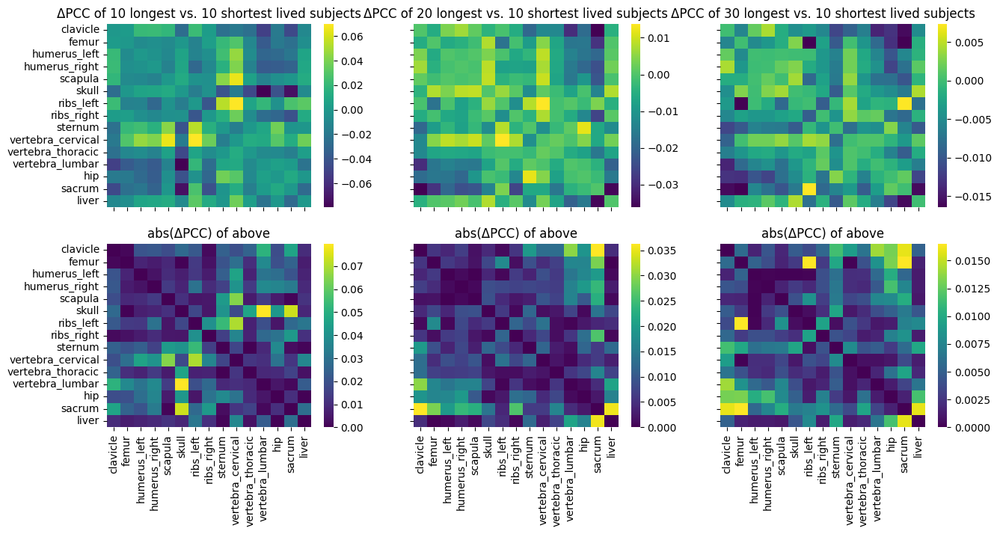

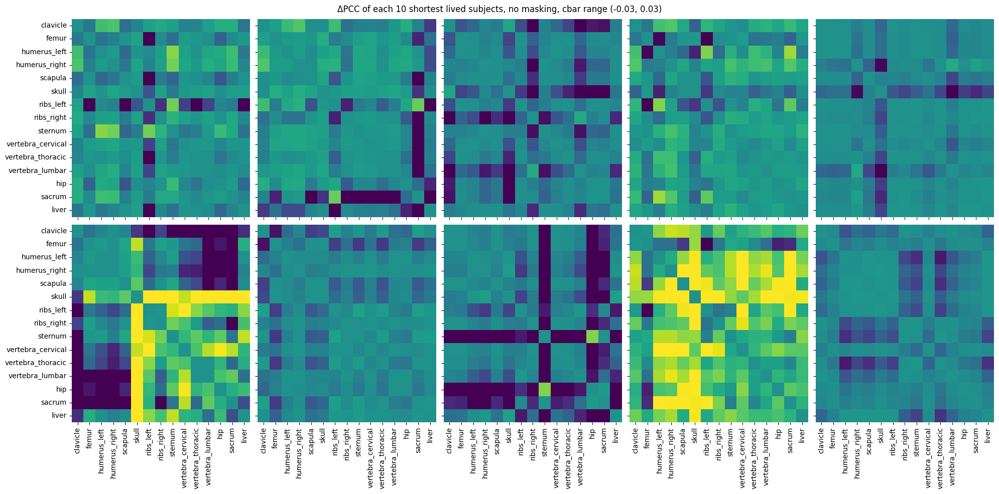

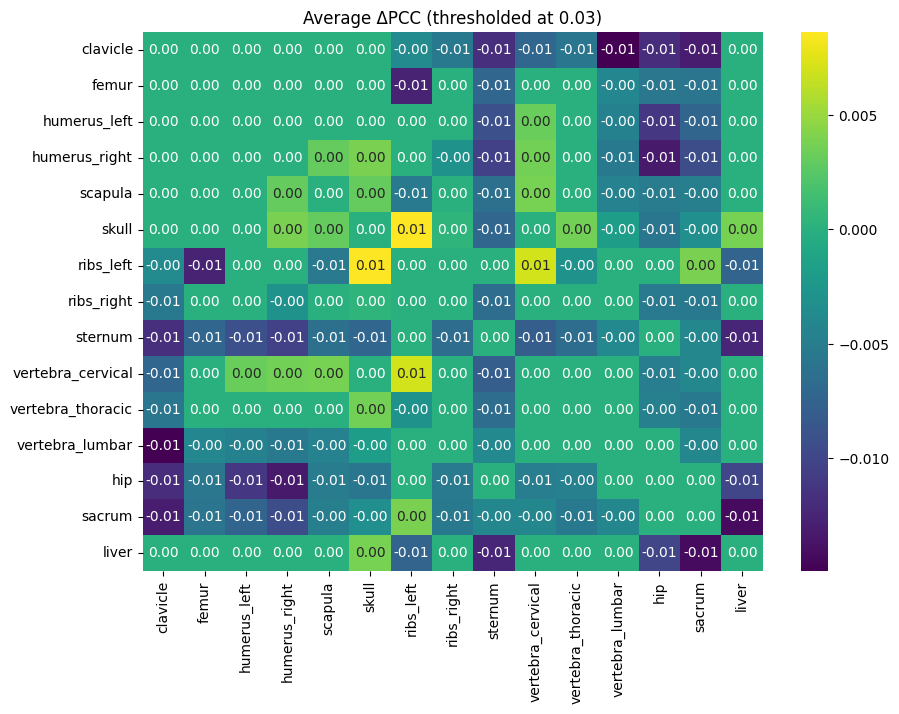

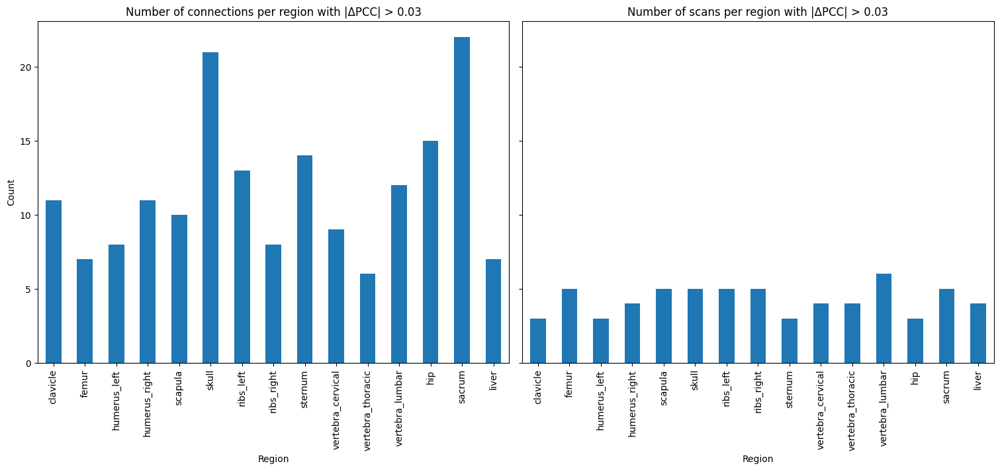

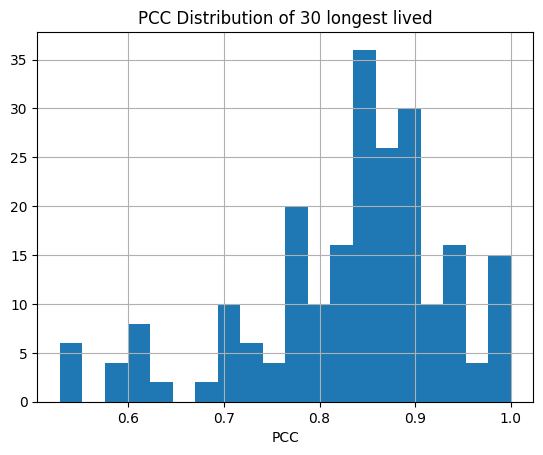

Mean: 0.8328, SD: 0.1049


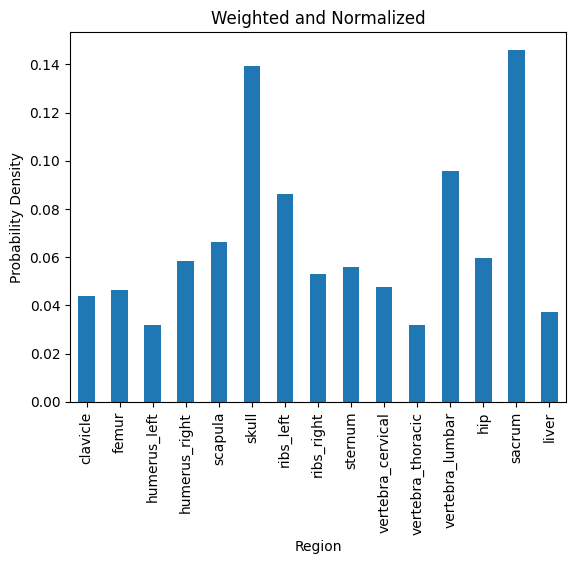

Number of Died <2 years patients: 76
Number of Lived >2 years patients: 65
Number of Lost to follow up, alive at last assessment patients: 11


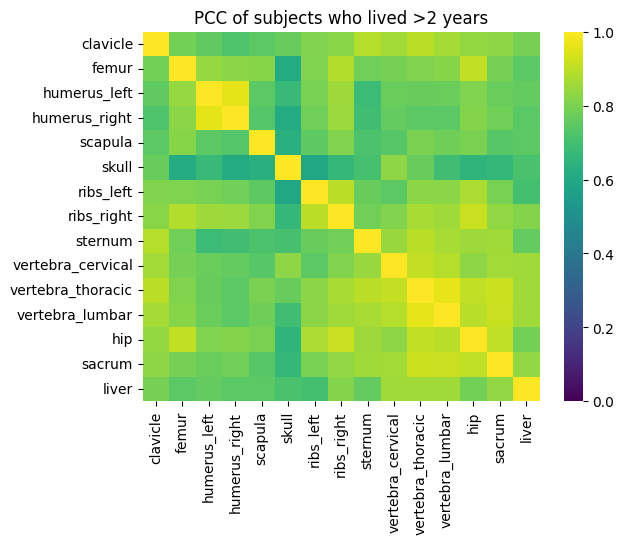

Range of average ΔPCC is (-0.0027, 0.0015)


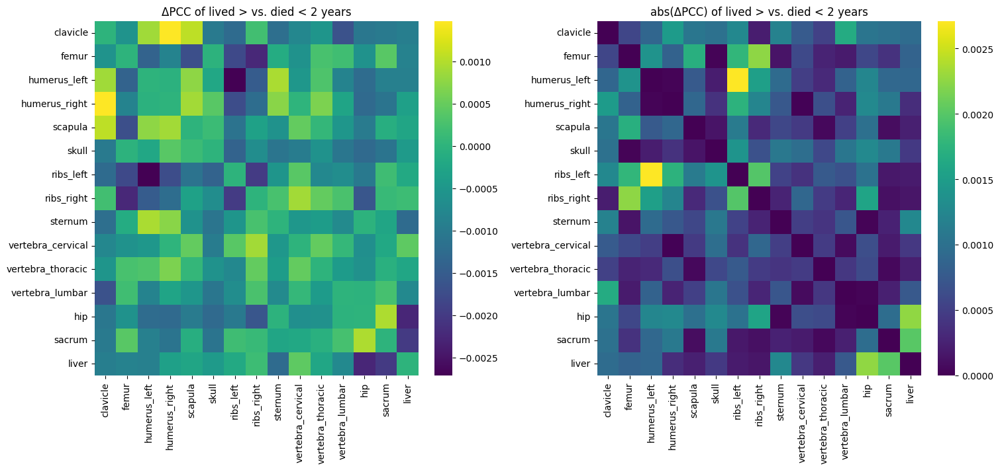

Range of average ΔPCC is (-0.0067, 0.0047)


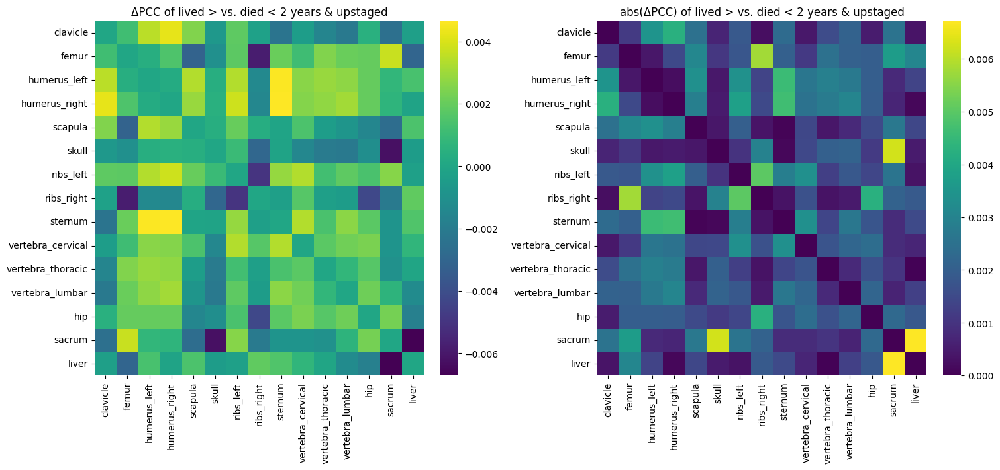

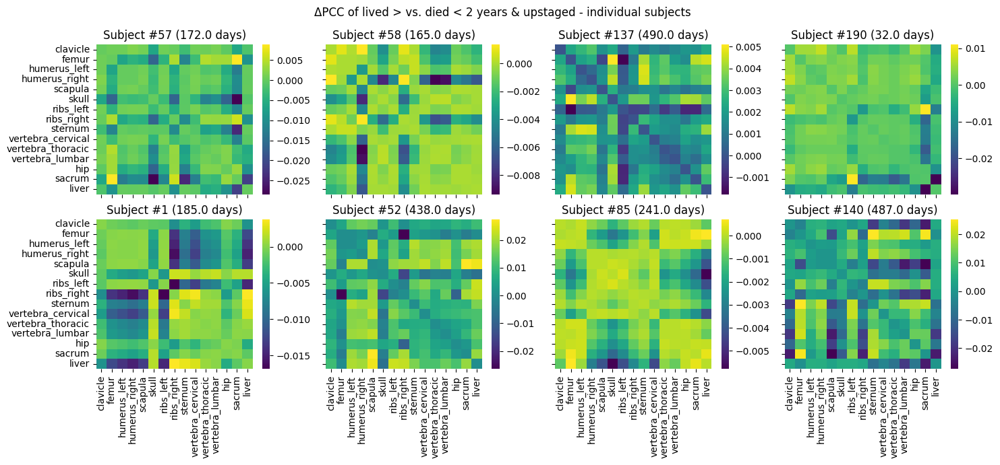

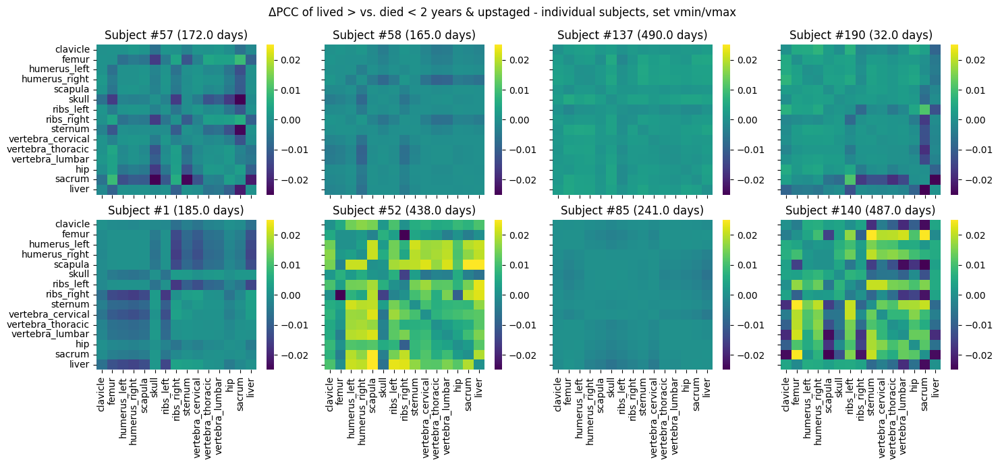

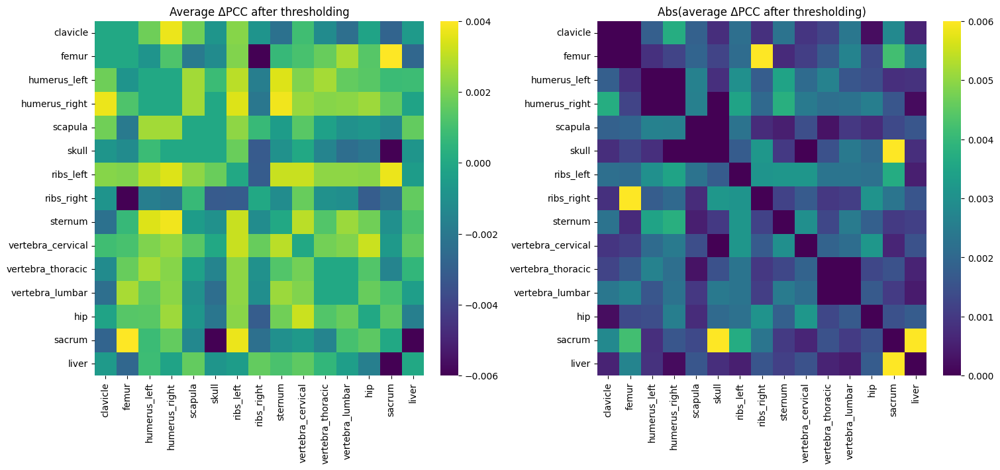

 ____           _      _____               _                        _   
|  _ \ ___  ___| |_   |_   _| __ ___  __ _| |_ _ __ ___   ___ _ __ | |_ 
| |_) / _ \/ __| __|____| || '__/ _ \/ _` | __| '_ ` _ \ / _ \ '_ \| __|
|  __/ (_) \__ \ ||_____| || | |  __/ (_| | |_| | | | | |  __/ | | | |_ 
|_|   \___/|___/\__|    |_||_|  \___|\__,_|\__|_| |_| |_|\___|_| |_|\__|
                                                                        
 ____                       _                _           _     
/ ___|  ___ __ _ _ __      / \   _ __   __ _| |_   _ ___(_)___ 
\___ \ / __/ _` | '_ \    / _ \ | '_ \ / _` | | | | / __| / __|
 ___) | (_| (_| | | | |  / ___ \| | | | (_| | | |_| \__ \ \__ \
|____/ \___\__,_|_| |_| /_/   \_\_| |_|\__,_|_|\__, |___/_|___/
                                               |___/           



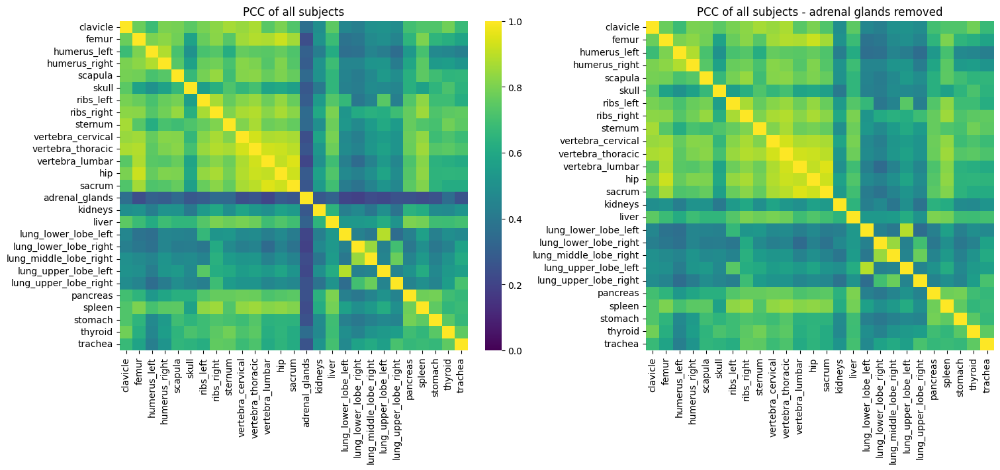

Number of IIB patients: 5
Number of IIIA patients: 69
Number of IIIB patients: 46


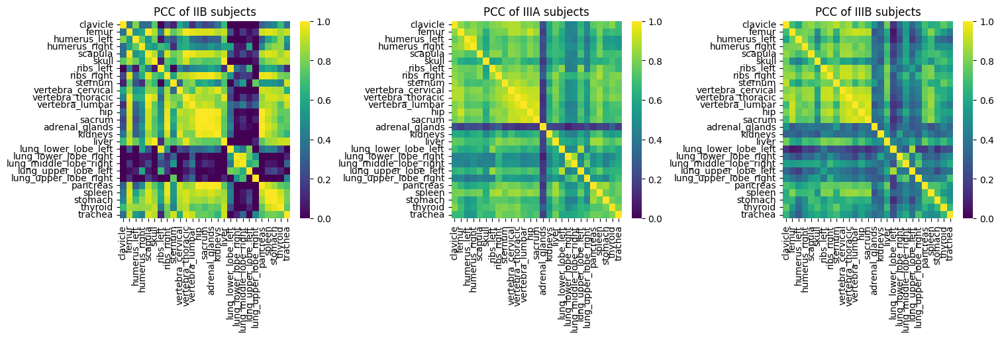

Range of average ΔPCC is (-0.0089, 0.0053)


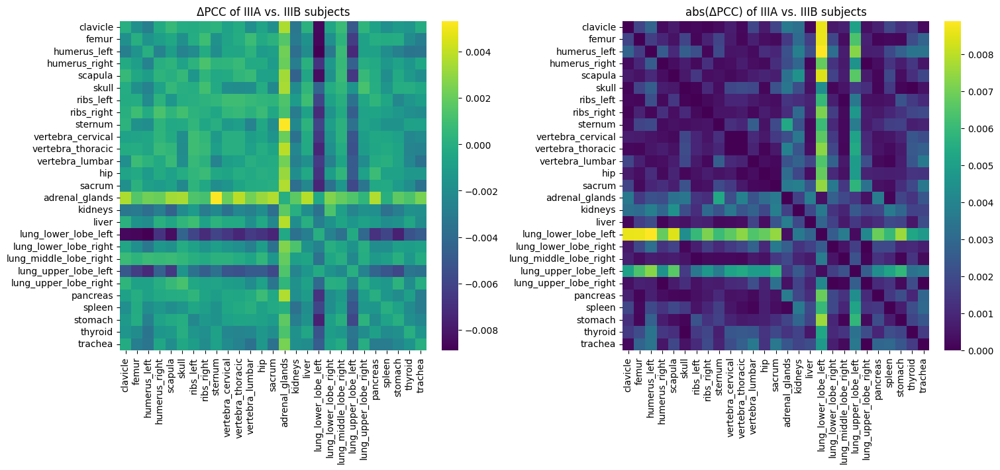

Range of average ΔPCC is (-0.0067, 0.0063)


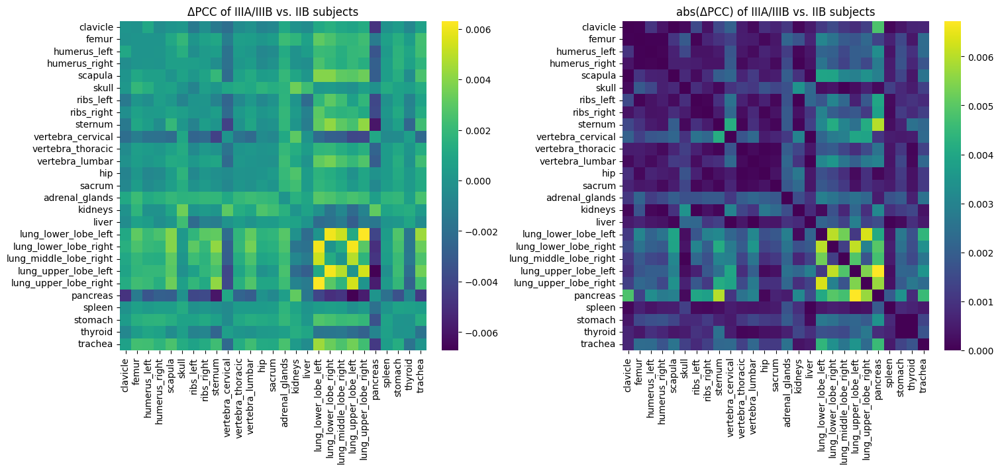

Range of average ΔPCC is (-0.0122, 0.0086)


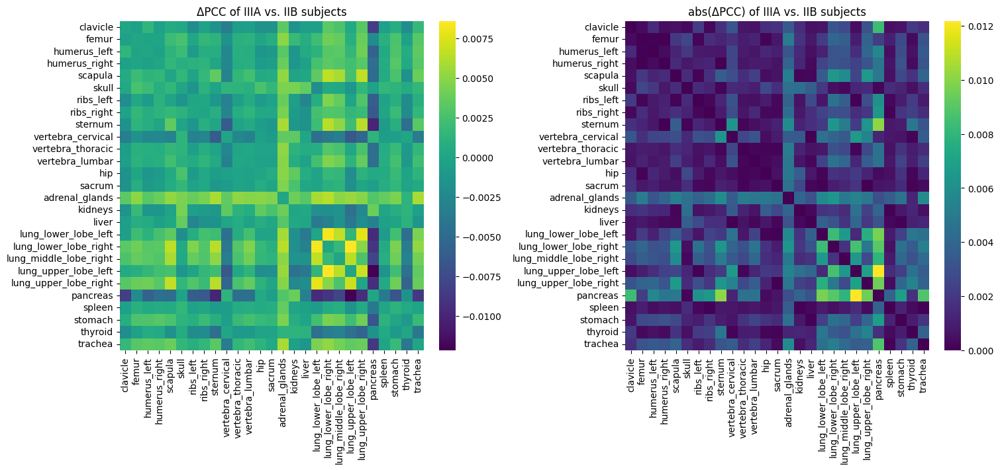

Range of average ΔPCC is (-0.0131, 0.0226)


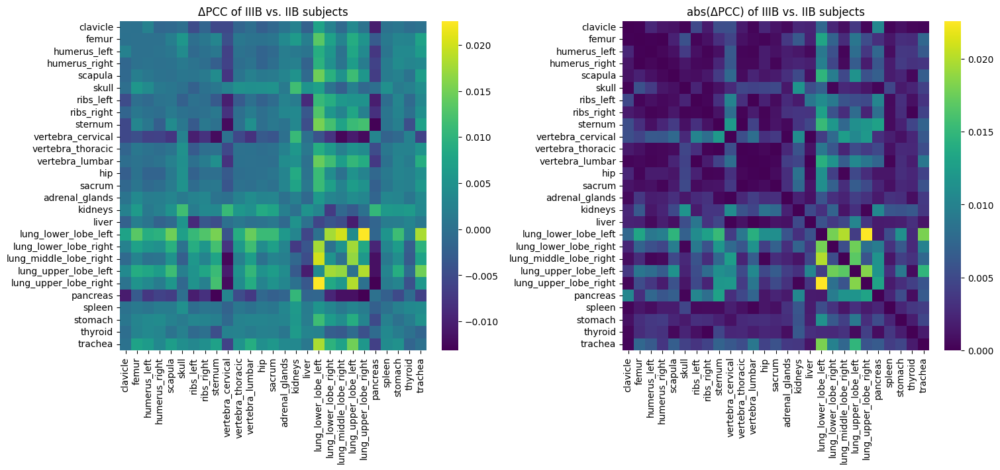

Number of IIIA patients: 69
Number of IIIB patients: 46
Range of average ΔPCC is (-0.0028, 0.0012)


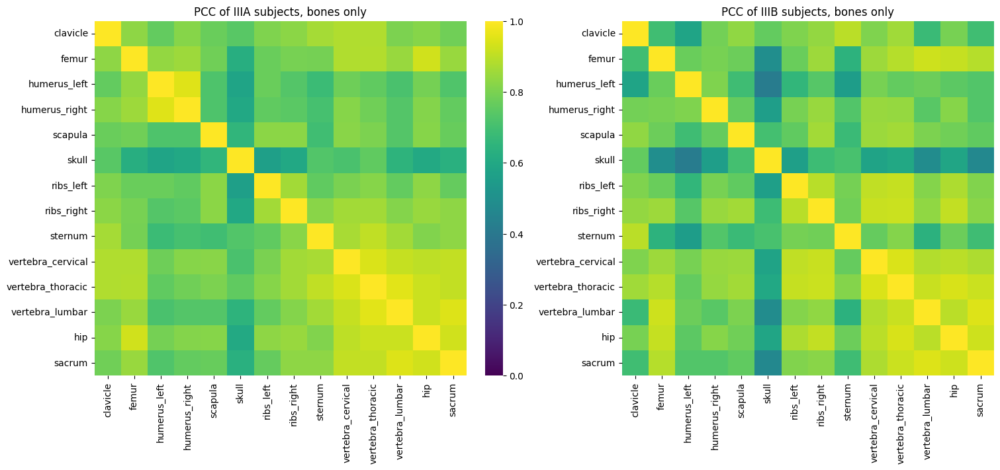

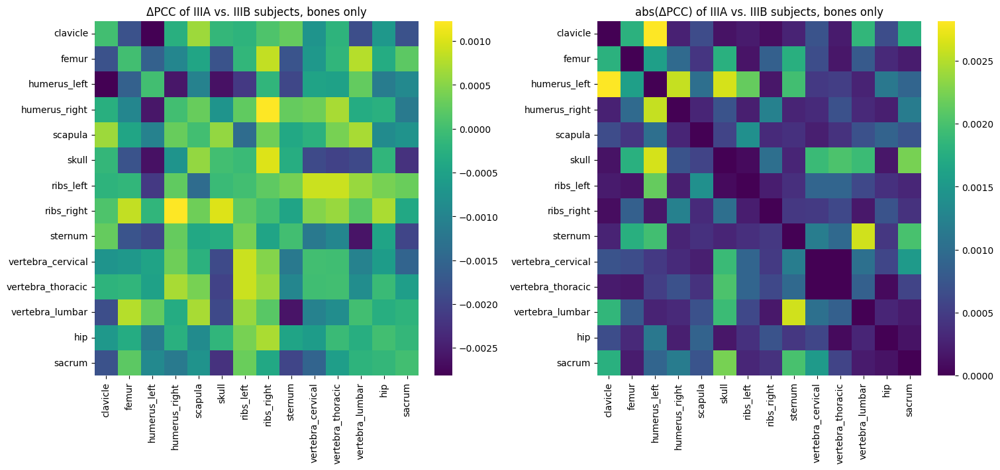

Number of Male patients: 75
Number of Female patients: 46


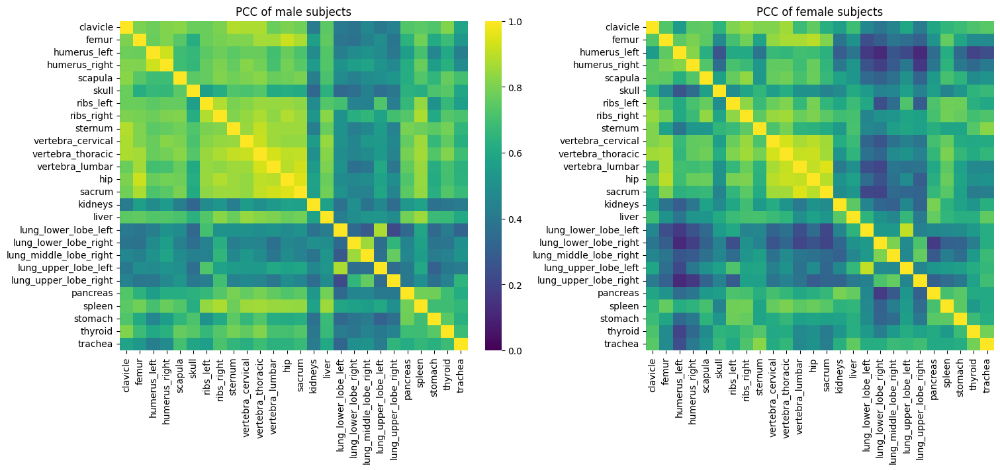

Range of average ΔPCC is (-0.0066, 0.0086)


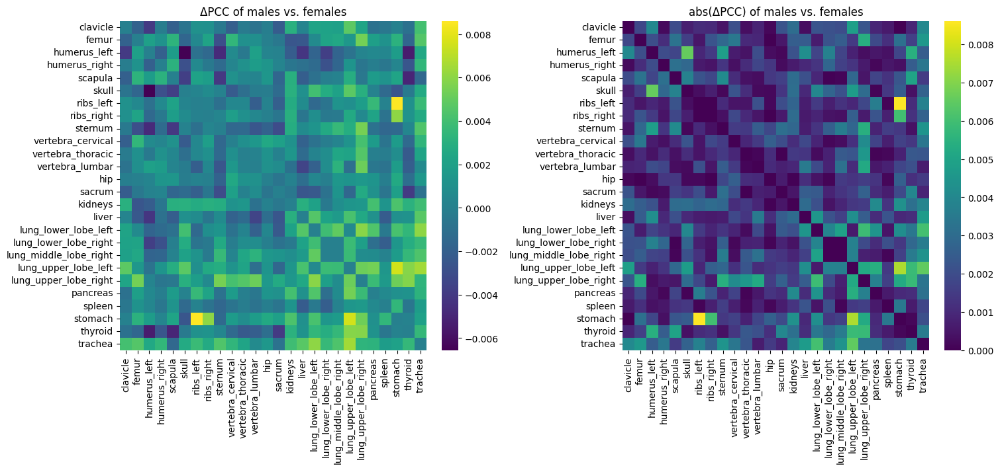

Number of No[(complete Q1a, then  sign and date form)] patients: 106
Number of Yes, confirmed in retrospect on previous CT/MRI scan[(complete Q1a - Q5)] patients: 4
Number of Yes, confirmed on additional directed CT/MRI scan <region of intrest>[(complete Q1a - Q5)] patients: 5
Number of Yes, unconfirmed by additional imaging[(complete Q1a, then sign and date form)] patients: 5


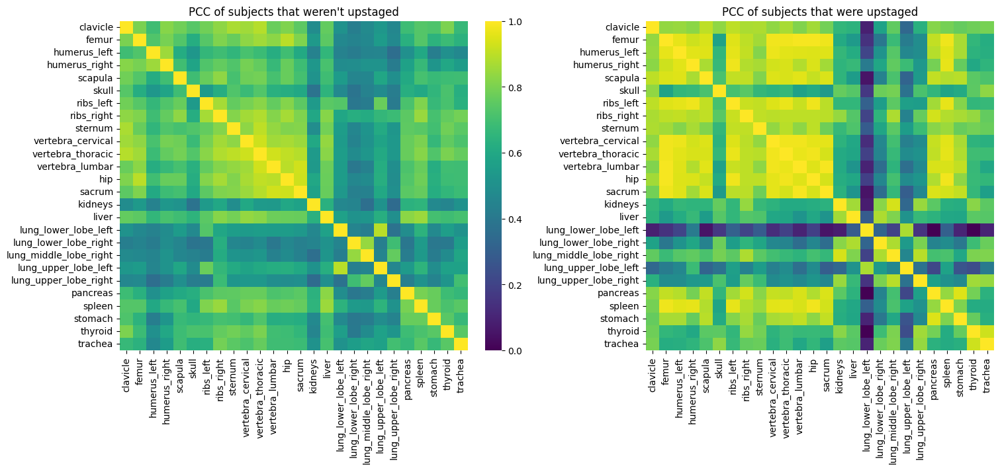

Range of average ΔPCC is (-0.0103, 0.0100)


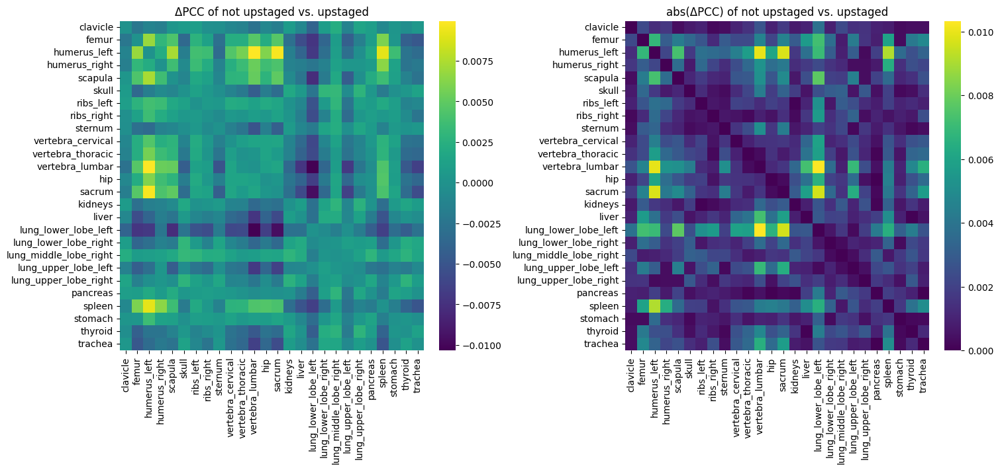

Number of Died <2 years patients: 57
Number of Lived >2 years patients: 63
Number of Lost to follow up, alive at last assessment patients: 1


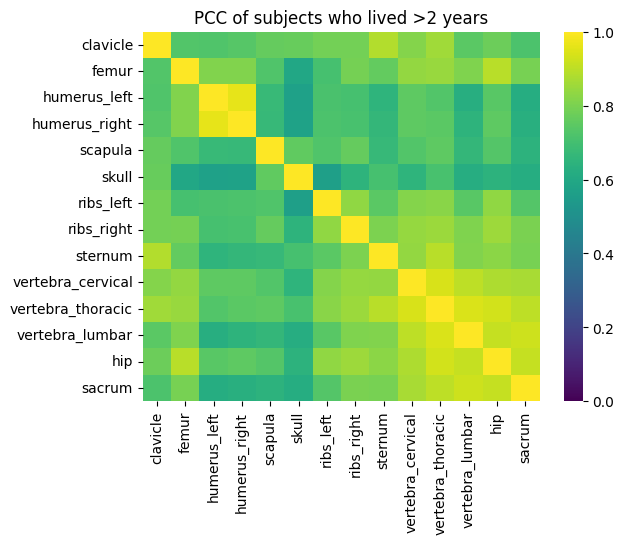

Range of average ΔPCC is (-0.0030, 0.0039)


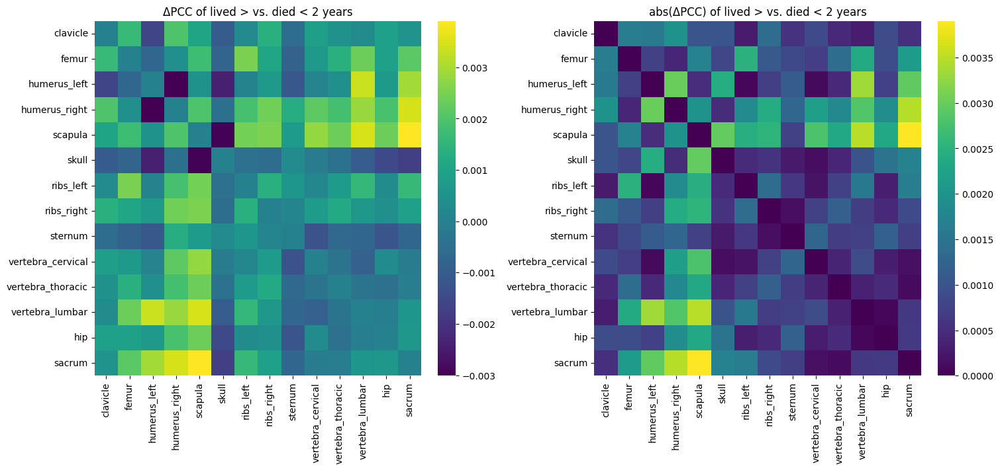

In [ ]:
# Cell for executing the separate pre-treatment and post-treatment analyses with my defined filenames

pre_text = pyfiglet.figlet_format("Pre-Treatment Scan Analysis", font="standard")
post_text = pyfiglet.figlet_format("Post-Treatment Scan Analysis", font="standard")
print(pre_text)
PreTreat(pretreat_filename)
print(post_text)
PostTreat(posttreat_filename)

In [ ]:
def Pre_Post_Compare(pretreat_filename, posttreat_filename): # Function for comparing the pre-treatment and post-treatment datasets
    pre_df = GetDF(pretreat_filename, ['CLINICAL STAGE', 'Patient ID'], bones_only=True)
    post_df = GetDF(posttreat_filename, ['CLINICAL STAGE', 'Patient ID'], bones_only=True)

    # Find patients that are in both datasets
    common_ids = set(pre_df.index.get_level_values('Patient ID')).intersection(set(post_df.index.get_level_values('Patient ID')))
    pre_common = pre_df.loc[pre_df.index.get_level_values('Patient ID').isin(common_ids)]
    post_common = post_df.loc[post_df.index.get_level_values('Patient ID').isin(common_ids)]

    print(f"Number of common patients between pre- and post-treatment datasets: {len(common_ids)}")

    pre_refnet = Refnet(pre_common)
    post_refnet = Refnet(post_common)

    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    Heatmap(pre_refnet, 0, 1, True, ax=ax[0])
    Heatmap(post_refnet, 0, 1, False, ax=ax[1])
    ax[0].set_title('PCC of Pre-Treatment common subjects')
    ax[1].set_title('PCC of Post-Treatment common subjects')
    plt.show()
    plt.close()

    resnet_list, avgresnet, vmin, vmax = Perturbation(pre_common, pre_refnet, post_common)
    fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    Heatmap(avgresnet, vmin, vmax, True, ax=ax[0])
    Heatmap(abs(avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    ax[0].set_title(delta+'PCC of Pre- vs. Post-Treatment common subjects')
    ax[1].set_title('abs('+delta+'PCC) of Pre- vs. Post-Treatment common subjects')
    plt.show()
    plt.close()


 ____                                 ____           _        
|  _ \ _ __ ___        __   _____    |  _ \ ___  ___| |_      
| |_) | '__/ _ \_____  \ \ / / __|   | |_) / _ \/ __| __|____ 
|  __/| | |  __/_____|  \ V /\__ \_  |  __/ (_) \__ \ ||_____|
|_|   |_|  \___|         \_/ |___(_) |_|   \___/|___/\__|     
                                                              
 _____               _                        _     ____                  
|_   _| __ ___  __ _| |_ _ __ ___   ___ _ __ | |_  / ___|  ___ __ _ _ __  
  | || '__/ _ \/ _` | __| '_ ` _ \ / _ \ '_ \| __| \___ \ / __/ _` | '_ \ 
  | || | |  __/ (_| | |_| | | | | |  __/ | | | |_   ___) | (_| (_| | | | |
  |_||_|  \___|\__,_|\__|_| |_| |_|\___|_| |_|\__| |____/ \___\__,_|_| |_|
                                                                          
    _                _           _     
   / \   _ __   __ _| |_   _ ___(_)___ 
  / _ \ | '_ \ / _` | | | | / __| / __|
 / ___ \| | | | (_| | | |_| \__ \ \__ \
/_/   \_\_| 

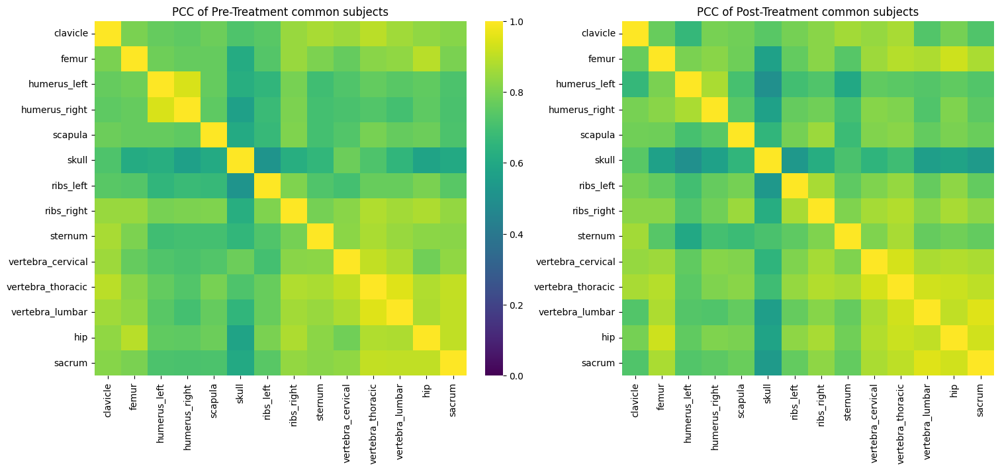

Range of average ΔPCC is (-0.0027, 0.0014)


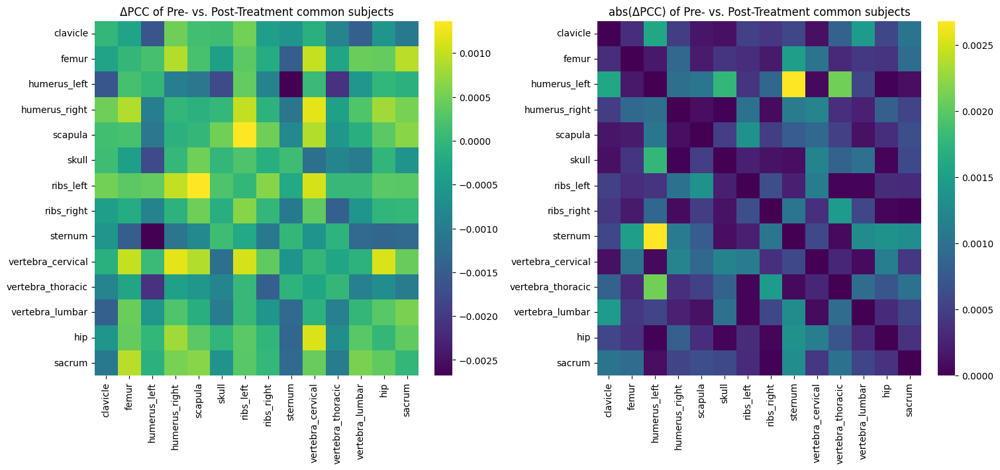

In [ ]:
# Running the pre vs. post treatment comparison function with my defined filenames
pre_post_text = pyfiglet.figlet_format("Pre- vs. Post- Treatment Scan Analysis", font="standard")
print(pre_post_text)
Pre_Post_Compare(pretreat_filename, posttreat_filename)

 ____               _____               _                        _   
|  _ \ _ __ ___    |_   _| __ ___  __ _| |_ _ __ ___   ___ _ __ | |_ 
| |_) | '__/ _ \_____| || '__/ _ \/ _` | __| '_ ` _ \ / _ \ '_ \| __|
|  __/| | |  __/_____| || | |  __/ (_| | |_| | | | | |  __/ | | | |_ 
|_|   |_|  \___|     |_||_|  \___|\__,_|\__|_| |_| |_|\___|_| |_|\__|
                                                                     
 ____                       _                _           _       
/ ___|  ___ __ _ _ __      / \   _ __   __ _| |_   _ ___(_)___   
\___ \ / __/ _` | '_ \    / _ \ | '_ \ / _` | | | | / __| / __|  
 ___) | (_| (_| | | | |  / ___ \| | | | (_| | | |_| \__ \ \__ \_ 
|____/ \___\__,_|_| |_| /_/   \_\_| |_|\__,_|_|\__, |___/_|___( )
                                               |___/          |/ 
                _                 
 _ __ ___  __ _(_) ___  _ __  ___ 
| '__/ _ \/ _` | |/ _ \| '_ \/ __|
| | |  __/ (_| | | (_) | | | \__ \
|_|  \___|\__, |_|\___/|_| |_|___/
         

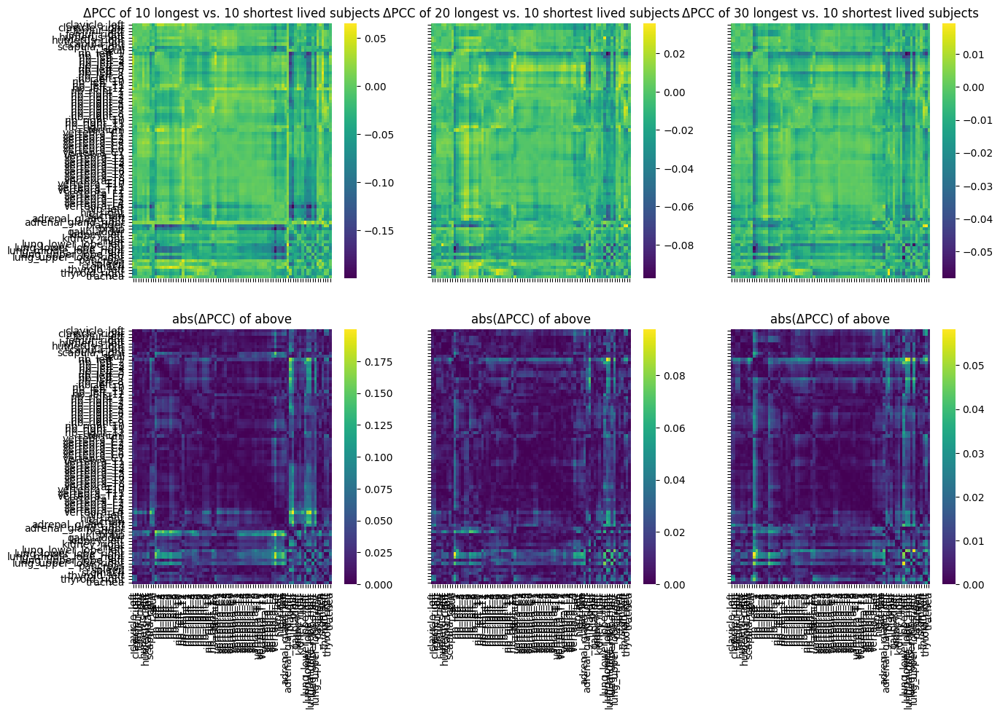

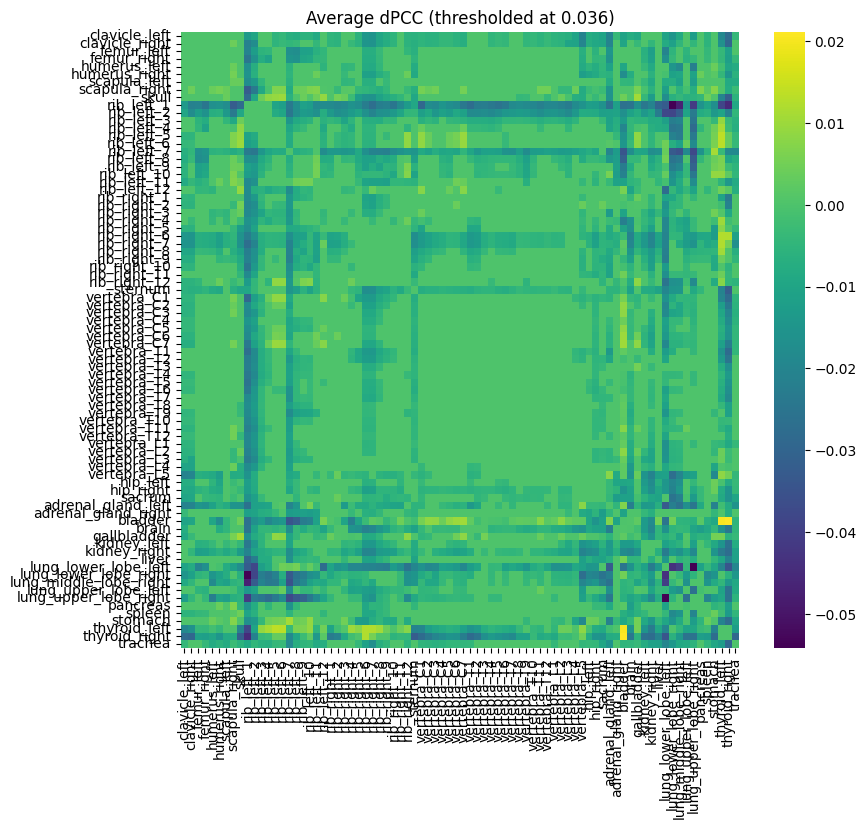

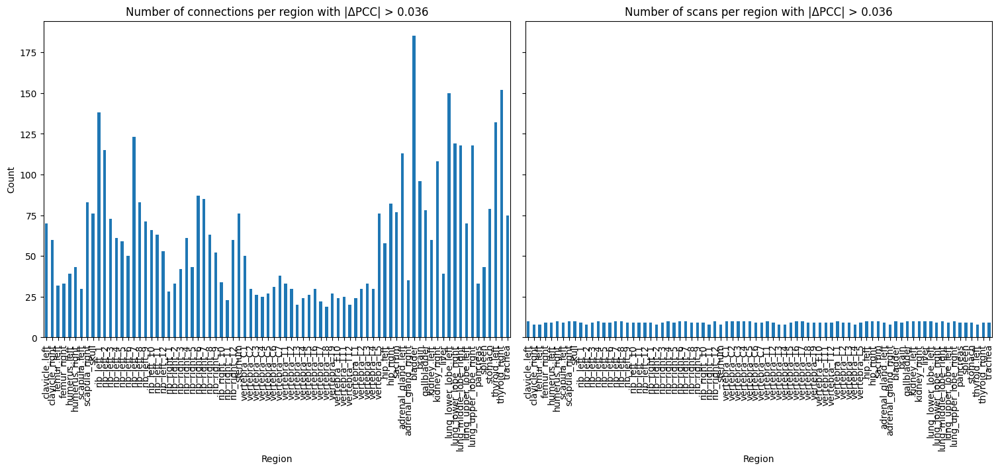

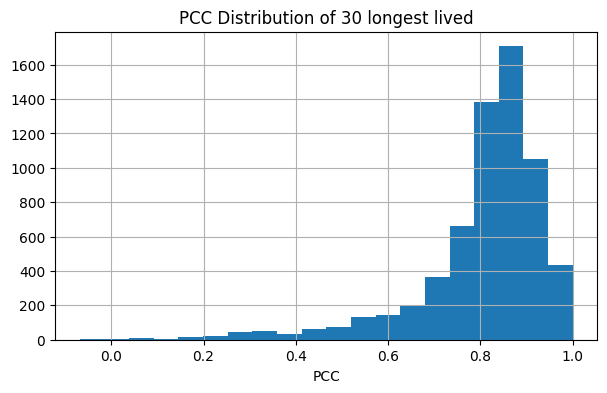

Mean: 0.8050, SD: 0.1424


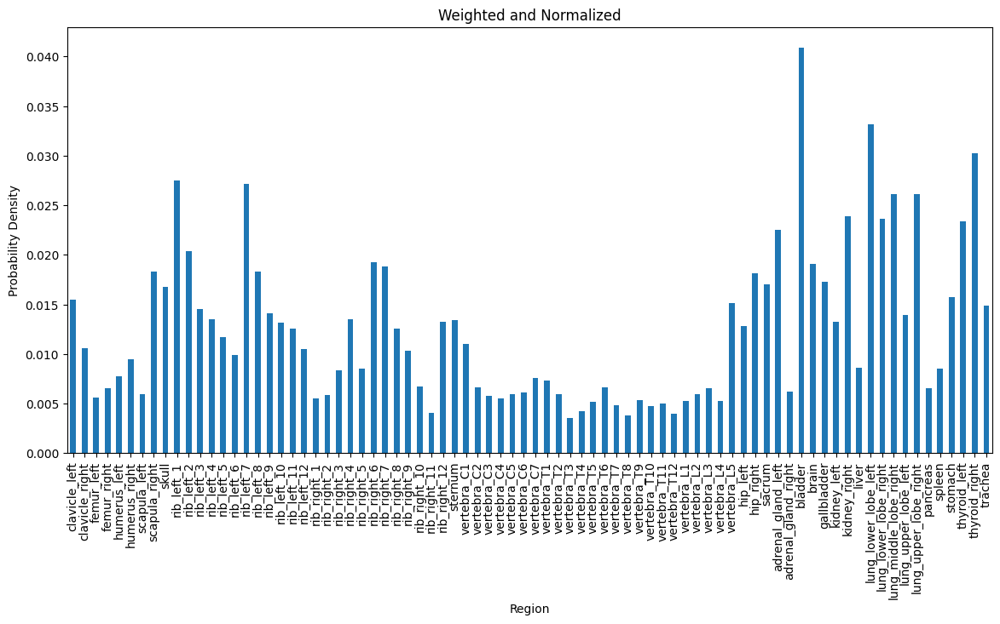

In [ ]:
# Analysis of pre-treament scans with unaveraged regions
pre_unaveraged_text = pyfiglet.figlet_format("Pre-Treatment Scan Analysis, regions unaveraged", font="standard")
print(pre_unaveraged_text)
# Comparing based on whether or not patient survived over 2 years or not (compare to OG paper), not all patients have this info
survival_df = GetDF(pretreat_unaveraged_filename, ['Patient ID', 'Days from Base_dt to DATE OF LAST CLINICAL ASSESSMENT', 'PATIENT\'S VITAL STATUS'], 
                    bones_only=False, bones_liver=False, index_cols=['Patient ID'], drop_lungs=False, drop_adrenals=False, drop_empty=True, use_unaveraged=True)
survival_df = survival_df.rename(columns={'Days from Base_dt to DATE OF LAST CLINICAL ASSESSMENT': 'days',
                                          "PATIENT\'S VITAL STATUS": 'status'})
two_years = 365*2
valid_statuses = ['Died <2 years', 'Lived >2 years', 'Lost to follow up, alive at last assessment']
survival_df.loc[(survival_df['status'] == 'dead') & (survival_df['days'] < two_years), 'status'] = valid_statuses[0]
survival_df.loc[(survival_df['status'] == 'dead') & (survival_df['days'] >= two_years), 'status'] = valid_statuses[1]
survival_df.loc[((survival_df['status'] == 'alive') | (survival_df['status'] == 'lost to follow up')) & (survival_df['days'] >= two_years), 
                'status'] = valid_statuses[1]
survival_df.loc[((survival_df['status'] == 'alive') | (survival_df['status'] == 'lost to follow up')) & (survival_df['days'] < two_years),
                   'status'] = valid_statuses[2]
survival_df = survival_df[survival_df['status'].isin(valid_statuses)]
survival_days = survival_df[['days']].copy()

# Comparing 10-20-30 longest lived patients to 10 shortest lived patients, and looking at the dPCC networks of those comparisons,
#  and then also looking at the distribution of PCC values in the longest lived group
# making sure 10 shortest lived patients are all in the "Died <2 years" group
sizes=[10,20,30]
fig, ax = plt.subplots(2,len(sizes), figsize=(15, 10), sharey=True, sharex=True)
for index, n in enumerate(sizes):
    longest_lived = survival_df.nlargest(n, 'days')
    print(f"{n} longest lived patients (days): {longest_lived['days'].mean():.1f} ± {longest_lived['days'].std():.1f}")
    print(f"Patient IDs: {longest_lived.index.tolist()}")
    longest_lived = longest_lived.drop(columns=['days', 'status'])
    shortest_lived = survival_df[survival_df['status'] == valid_statuses[0]].nsmallest(10, 'days')
    print(f"10 shortest lived patients (days): {shortest_lived['days'].mean():.1f} ± {shortest_lived['days'].std():.1f}")
    print(f"Patient IDs: {shortest_lived.index.tolist()}")
    shortest_lived = shortest_lived.drop(columns=['days', 'status'])
    longest_lived_refnet = Refnet(longest_lived)
    shortest_lived_resnet_list, shortest_lived_avgresnet, vmin, vmax = Perturbation(longest_lived, longest_lived_refnet, shortest_lived)
    Heatmap(shortest_lived_avgresnet, vmin, vmax, True, ax=ax[0,index])
    Heatmap(abs(shortest_lived_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1,index])
    ax[0,index].set_title(delta+f'PCC of {n} longest vs. 10 shortest lived subjects')
    ax[1,index].set_title('abs('+delta+f'PCC) of above')
    mean = longest_lived_refnet.values.flatten().mean()
    std = longest_lived_refnet.values.flatten().std()
    print(f"{n} Longest Lived PCC Mean: {mean:.4f}, SD: {std:.4f} \n \n")
plt.show()
plt.close()

#  Looking at the specific connections that are most different between the 30 longest lived and 10 shortest lived patients,
#  using a threshold based on the correlation between dPCC and survival days 
# (n=30 and PCC=0.74, so threshold is 0.036 since that's the r value that corresponds to a p value of 0.05 for n=30)
threshold_30 = 0.036 #n=30 and PCC=0.74
region_counts = {}
scan_counts = {}
shortest_lived_resnet_masked_list = []
for resnet in shortest_lived_resnet_list:
    mask = resnet.abs() > threshold_30
    masked_resnet = resnet.where(mask, other=0)
    for index in resnet.index:
        count_sum = mask.loc[index].sum()
        region_counts[index] = region_counts.get(index, 0) + count_sum
        count_any = mask.loc[index].any()
        scan_counts[index] = scan_counts.get(index, 0) + count_any
    shortest_lived_resnet_masked_list.append(masked_resnet)
shortest_lived_avgresnet_masked = sum(shortest_lived_resnet_masked_list) / len(shortest_lived_resnet_masked_list)
fig, ax = plt.subplots(figsize=(9,8))
masked_heatmap_corrected = sns.heatmap(shortest_lived_avgresnet_masked, cbar=True, yticklabels=True, xticklabels=True, cmap=palette, ax=ax)
ax.set_title('Average dPCC (thresholded at 0.036)')
plt.show()
plt.close()
fig, ax = plt.subplots(1,2, figsize=(15, 7), sharey=True, gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
region_counts_barplot_df = pd.DataFrame(list(region_counts.items()), columns=['Region', 'Count'])
region_counts_barplot_df.plot.bar(x='Region', y='Count', title=f'Number of connections per region with |{delta}PCC| > {threshold_30}', legend=False, ax=ax[0])
scan_counts_barplot_df = pd.DataFrame(list(scan_counts.items()), columns=['Region', 'Count'])
scan_counts_barplot_df.plot.bar(x='Region', y='Count', title=f'Number of scans per region with |{delta}PCC| > {threshold_30}', legend=False, ax=ax[1])
ax[0].set_ylabel('Count')
plt.show()
plt.close()
fig = plt.figure(figsize=(7,4))
pd.Series(longest_lived_refnet.values.flatten()).hist(bins=20)
plt.xlabel('PCC')
plt.title('PCC Distribution of 30 longest lived')
plt.show()
plt.close()
mean = longest_lived_refnet.values.flatten().mean()
std = longest_lived_refnet.values.flatten().std()
print(f"Mean: {mean:.4f}, SD: {std:.4f}")

# making a weighted/normalized barplot to account for some regions having a lot of high dPCC values but not across a lot of patients
weights = list(scan_counts.values())
weighted_barplot_df = region_counts_barplot_df.copy()
weighted_barplot_df['Weighted Count'] = weighted_barplot_df['Count'] * weights
weighted_barplot_df['Probability Density'] = weighted_barplot_df['Weighted Count'] / weighted_barplot_df['Weighted Count'].sum()
ax = weighted_barplot_df.plot.bar(x='Region', y='Probability Density', title='Weighted and Normalized', legend=False, figsize=(14,6.5))
ax.set_ylabel('Probability Density')
plt.show()
plt.close()

In [ ]:
# now looking at the healthy ENHANCE.PET subjects compared to the NSCLC ACRIN6668 subjects
def Enhance(enhance_filename, acrin_filename, bones_only, drop_adrenals, n, threshold):
    print(f"Healthy vs NSCLC Analysis, {n} healthy subjects")

    enhance_df = GetDF(enhance_filename, ['Patient ID'], bones_only=bones_only, drop_adrenals=drop_adrenals, enhance=True)
    enhance_df = enhance_df.iloc[:n] # Only take the first n healthy subjects for comparison (out of 513)
    refnet = Refnet(enhance_df)
    mean = refnet.values.flatten().mean()
    std = refnet.values.flatten().std()
    print(f"Refnet PCC Mean: {mean:.4f}, SD: {std:.4f}")

    acrin_df = GetDF(acrin_filename, ['Patient ID'], bones_only=bones_only, drop_adrenals=drop_adrenals, enhance=True)

    enhance_resnet_list, enhance_avgresnet, vmin, vmax = Perturbation(enhance_df, refnet, acrin_df)

    enhance_resnet_masked_list = []
    for i, resnet in enumerate(enhance_resnet_list):
        mask = resnet.abs() > threshold
        masked_resnet = resnet.where(mask, other=0)
        enhance_resnet_masked_list.append(masked_resnet)
    enhance_avgresnet_masked = sum(enhance_resnet_masked_list) / len(enhance_resnet_masked_list)

    fig, ax= plt.subplots(1, 3, figsize=(18, 6), gridspec_kw={'width_ratios': [1, 1, 1]}, layout="constrained")
    Heatmap(refnet, 0, 1, True, ax=ax[0])
    ax[0].set_title(f'PCC of {n} ENHANCE.PET subjects')
    Heatmap(enhance_avgresnet, vmin, vmax, True, ax=ax[1])
    ax[1].set_title(delta+f'PCC of {n} ENHANCE.PET vs. ACRIN6668 subjects')
    sns.heatmap(enhance_avgresnet_masked, cbar=True, yticklabels=True, xticklabels=True, cmap=palette, ax=ax[2])
    ax[2].set_title(delta+f'PCC of {n} ENHANCE.PET vs. ACRIN6668 subjects, thresholded at {threshold}')
    
    plt.show()
    plt.close()

    # sex_df = GetDF(enhance_filename, ['Sex', 'Patient ID'], bones_only=bones_only, drop_adrenals=drop_adrenals, enhance=True)
    # males = SplitDF(sex_df, ['Sex', 'Patient ID'], 'M')
    # females = SplitDF(sex_df, ['Sex', 'Patient ID'], 'F')
    # fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    # males_refnet = Refnet(males)
    # females_refnet = Refnet(females)
    # Heatmap(males_refnet, 0, 1, True, ax=ax[0])
    # Heatmap(females_refnet, 0, 1, False, ax=ax[1])
    # ax[0].set_title('PCC of male subjects')
    # ax[1].set_title('PCC of female subjects')
    # plt.show()
    # plt.close()
    # sex_resnet_list, sex_avgresnet, vmin, vmax = Perturbation(males, males_refnet, females)
    # fig, ax = plt.subplots(1,2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1]}, layout="constrained")
    # Heatmap(sex_avgresnet, vmin, vmax, True, ax=ax[0])
    # Heatmap(abs(sex_avgresnet), 0, max(abs(vmin), vmax), True, ax=ax[1])
    # ax[0].set_title(delta+'PCC of males vs. females')
    # ax[1].set_title('abs('+delta+'PCC) of males vs. females')
    # plt.show()
    # plt.close()

Healthy vs NSCLC Analysis, 513 healthy subjects
Refnet PCC Mean: 0.7427, SD: 0.1464
Range of average ΔPCC is (-0.0016, 0.0084)


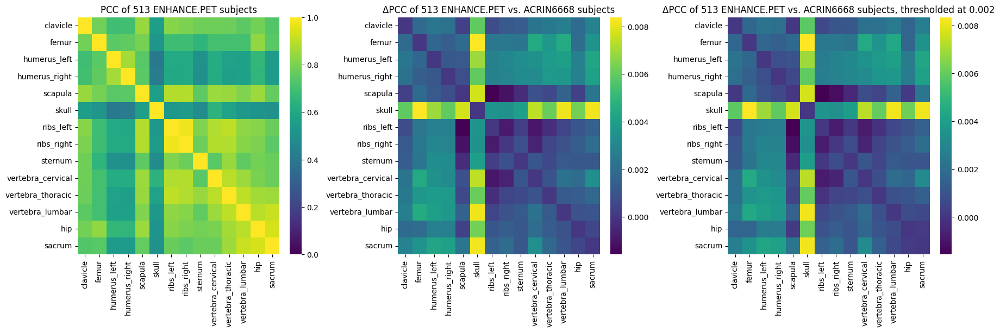

Healthy vs NSCLC Analysis, 50 healthy subjects
Refnet PCC Mean: 0.7088, SD: 0.1638
Range of average ΔPCC is (-0.0078, 0.0750)


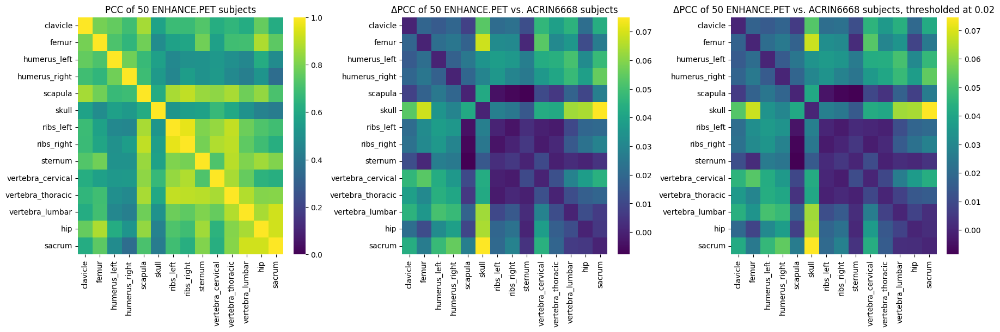

Healthy vs NSCLC Analysis, 513 healthy subjects
Refnet PCC Mean: 0.5891, SD: 0.1834
Range of average ΔPCC is (-0.0023, 0.0158)


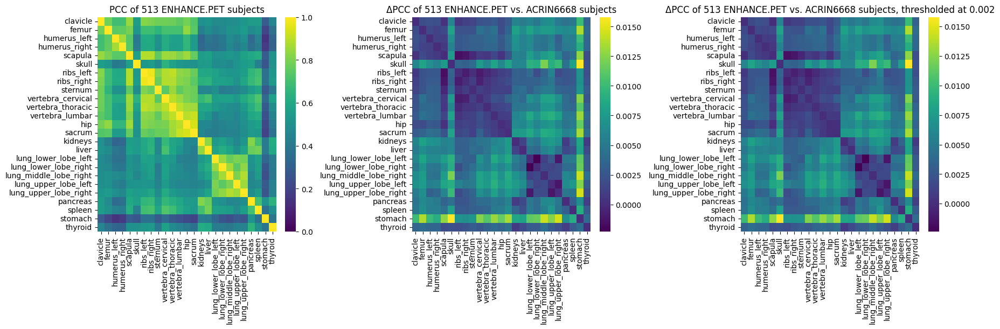

In [ ]:
# Running the above function with different parameters to look at the healthy vs. NSCLC comparison in different ways
Enhance(enhance_filename, pretreat_filename, True, True, 513, 0.002)
Enhance(enhance_filename, pretreat_filename, True, True, 50, 0.02)
Enhance(enhance_filename, pretreat_filename, False, True, 513, 0.002)

Healthy vs NSCLC Analysis, 47 healthy subjects per subset, 10 subsets, threshold 0.02
155 subjects in perturbation dataset
Subset 1:
Refnet PCC Mean: 0.7395, SD: 0.1408
Range of average ΔPCC is (-0.0052, 0.0707)
ΔPCC Mean: 0.0223, SD: 0.0176, Absolute Mean: 0.0227, Absolute SD: 0.0171
Subset 2:
Refnet PCC Mean: 0.6753, SD: 0.1969
Range of average ΔPCC is (-0.0059, 0.0957)
ΔPCC Mean: 0.0253, SD: 0.0212, Absolute Mean: 0.0259, Absolute SD: 0.0205
Subset 3:
Refnet PCC Mean: 0.7535, SD: 0.1305
Range of average ΔPCC is (-0.0067, 0.0830)
ΔPCC Mean: 0.0223, SD: 0.0183, Absolute Mean: 0.0226, Absolute SD: 0.0179
Subset 4:
Refnet PCC Mean: 0.6710, SD: 0.1716
Range of average ΔPCC is (-0.0067, 0.0885)
ΔPCC Mean: 0.0298, SD: 0.0208, Absolute Mean: 0.0301, Absolute SD: 0.0203
Subset 5:
Refnet PCC Mean: 0.7731, SD: 0.1207
Range of average ΔPCC is (-0.0156, 0.0496)
ΔPCC Mean: 0.0128, SD: 0.0134, Absolute Mean: 0.0146, Absolute SD: 0.0114
Subset 6:
Refnet PCC Mean: 0.8172, SD: 0.1122
Range of average

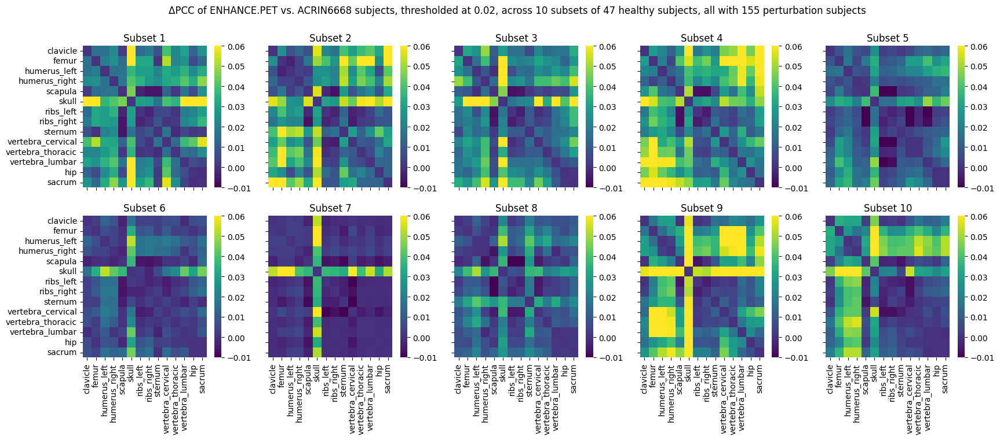

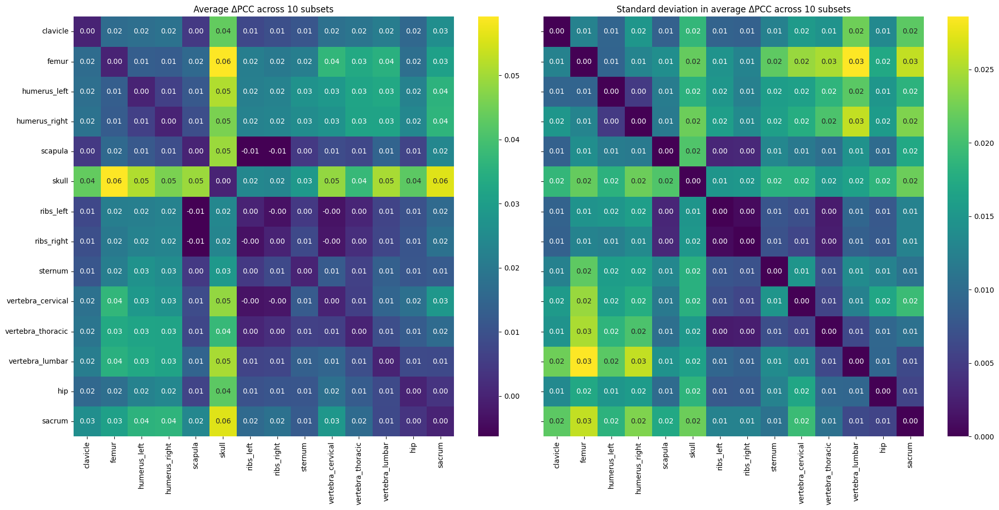

Healthy vs Healthy Analysis, 47 healthy subjects per subset, 10 subsets, threshold 0.02, 142 healthy subjects as perturbation, 3 repeats per subset
Refnet PCC Mean: 0.7395, SD: 0.1408
Range of average ΔPCC is (-0.0058, 0.0021)
ΔPCC Mean: -0.0010, SD: 0.0016, Absolute Mean: 0.0014, Absolute SD: 0.0013
Range of average ΔPCC is (-0.0058, 0.0021)
ΔPCC Mean: -0.0010, SD: 0.0016, Absolute Mean: 0.0014, Absolute SD: 0.0013
Range of average ΔPCC is (-0.0058, 0.0021)
ΔPCC Mean: -0.0010, SD: 0.0016, Absolute Mean: 0.0014, Absolute SD: 0.0013
Refnet PCC Mean: 0.6753, SD: 0.1969
Range of average ΔPCC is (-0.0028, 0.0080)
ΔPCC Mean: 0.0006, SD: 0.0019, Absolute Mean: 0.0013, Absolute SD: 0.0015
Range of average ΔPCC is (-0.0028, 0.0080)
ΔPCC Mean: 0.0006, SD: 0.0019, Absolute Mean: 0.0013, Absolute SD: 0.0015
Range of average ΔPCC is (-0.0028, 0.0080)
ΔPCC Mean: 0.0006, SD: 0.0019, Absolute Mean: 0.0013, Absolute SD: 0.0015
Refnet PCC Mean: 0.7535, SD: 0.1305
Range of average ΔPCC is (-0.0079, 0.00

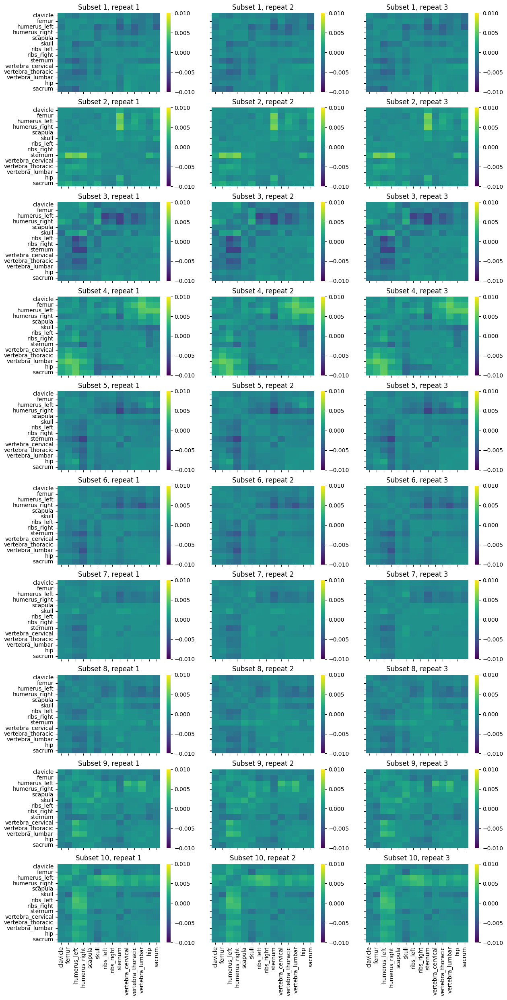

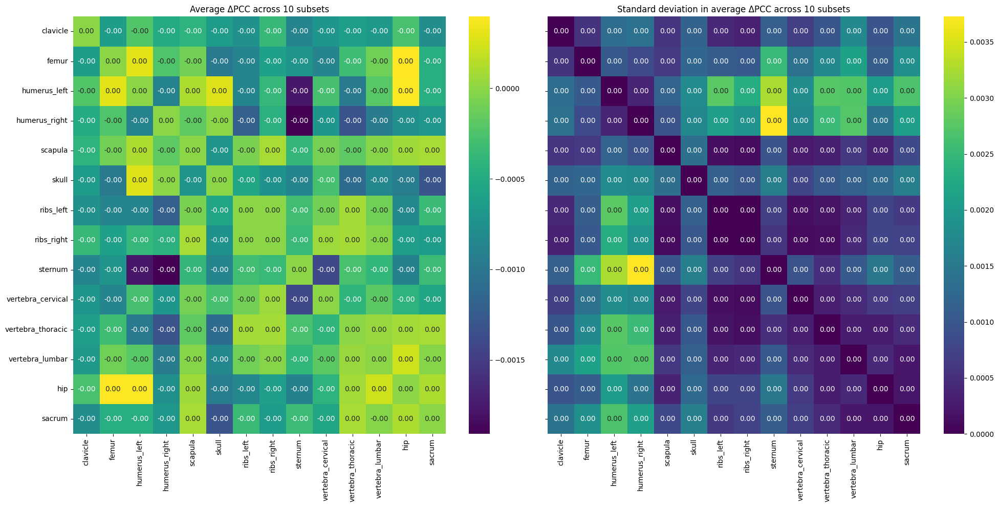

Healthy vs NSCLC Analysis, 47 healthy subjects per subset, 10 subsets, threshold 0.02
152 subjects in perturbation dataset
Subset 1:
Refnet PCC Mean: 0.5844, SD: 0.1995
Range of average ΔPCC is (-0.0321, 0.1002)
ΔPCC Mean: 0.0339, SD: 0.0251, Absolute Mean: 0.0348, Absolute SD: 0.0238
Subset 2:
Refnet PCC Mean: 0.5362, SD: 0.2245
Range of average ΔPCC is (-0.0224, 0.1727)
ΔPCC Mean: 0.0448, SD: 0.0363, Absolute Mean: 0.0456, Absolute SD: 0.0353
Subset 3:
Refnet PCC Mean: 0.6122, SD: 0.2280
Range of average ΔPCC is (-0.0285, 0.2218)
ΔPCC Mean: 0.0350, SD: 0.0397, Absolute Mean: 0.0367, Absolute SD: 0.0381
Subset 4:
Refnet PCC Mean: 0.5452, SD: 0.2002
Range of average ΔPCC is (-0.0218, 0.1245)
ΔPCC Mean: 0.0423, SD: 0.0287, Absolute Mean: 0.0428, Absolute SD: 0.0279
Subset 5:
Refnet PCC Mean: 0.6825, SD: 0.1368
Range of average ΔPCC is (-0.0234, 0.0792)
ΔPCC Mean: 0.0173, SD: 0.0169, Absolute Mean: 0.0194, Absolute SD: 0.0143
Subset 6:
Refnet PCC Mean: 0.6872, SD: 0.1674
Range of average

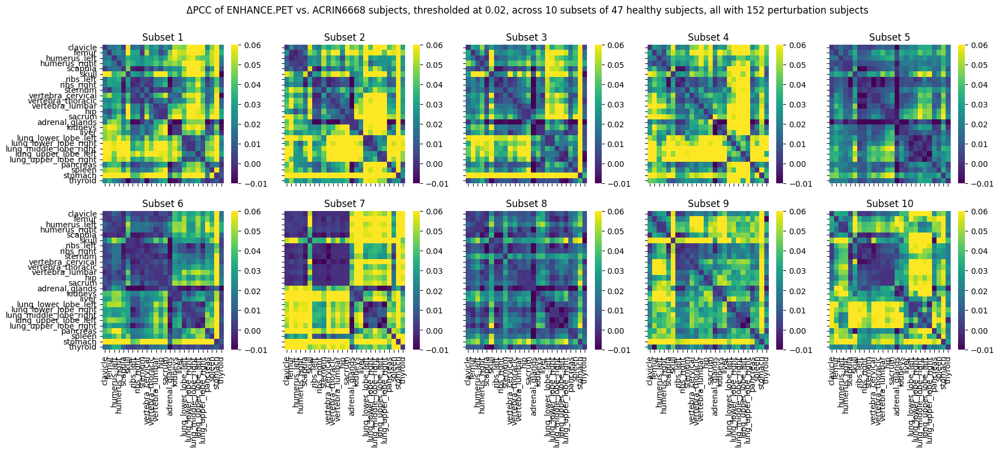

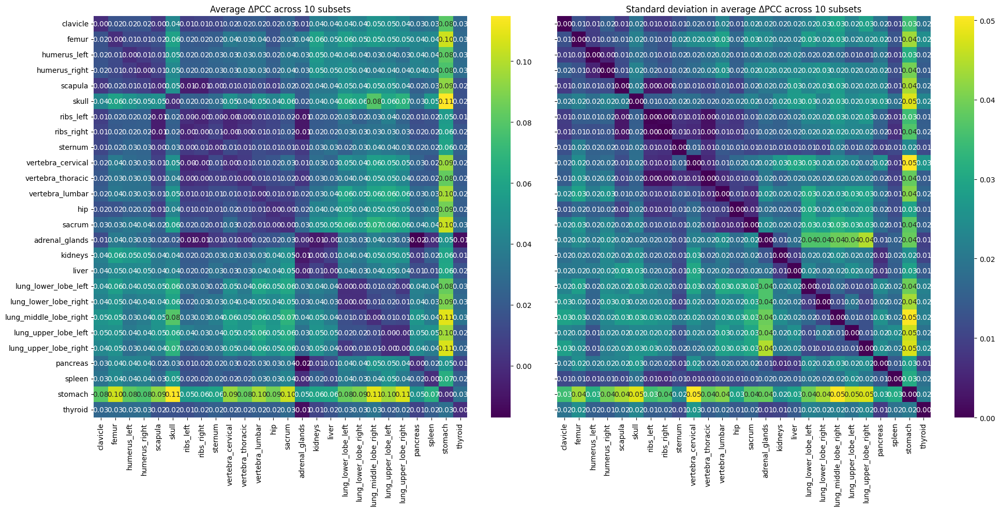

In [ ]:
# Subset analysis of the healthy vs. NSCLC comparison or healthy vs. healthy, chosen by parameters
# if include_acrin=False, then it's healthy vs. healthy, where the perturbations are other healthy subjects not in the reference subset, and m is how many healthy subjects to use as perturbation
# default is include_acrin=True, so m=0 and m_repeats=1 are ignored, and it's just the healthy vs. NSCLC comparison
def Enhance_errors(enhance_filename, pretreat_filename, bones_only, drop_adrenals, n, threshold, repeats, include_acrin=True, m=0, m_repeats=1):
    enhance_df = GetDF(enhance_filename, ['Patient ID'], bones_only=bones_only, drop_adrenals=drop_adrenals, enhance=True)
    
    if include_acrin:
        print(f"Healthy vs NSCLC Analysis, {n} healthy subjects per subset, {repeats} subsets, threshold {threshold}")

        acrin_df = GetDF(pretreat_filename, ['Patient ID'], bones_only=bones_only, drop_adrenals=drop_adrenals, enhance=True)
        perturb_df=acrin_df
        print(f"{len(perturb_df)} subjects in perturbation dataset")
        fig, axes = plt.subplots(repeats//5, repeats//2, figsize=(20, 7), sharex=True, sharey=True)
        
        repeats_list = []

        for i in range(repeats):
            print(f"Subset {i+1}:")
            refnet_subset = enhance_df.iloc[i*n:(i+1)*n]
            # print(len(refnet_subset))
            refnet = Refnet(refnet_subset)
            mean_refnet = refnet.values.flatten().mean()
            std_refnet = refnet.values.flatten().std()
            print(f"Refnet PCC Mean: {mean_refnet:.4f}, SD: {std_refnet:.4f}")

            enhance_subset_resnet_list, enhance_subset_avgresnet, vmin, vmax = Perturbation(refnet_subset, refnet, perturb_df)
            enhance_subset_avgresnet_stacked = enhance_subset_avgresnet.stack()
            mean = enhance_subset_avgresnet_stacked.mean()
            std = enhance_subset_avgresnet_stacked.std()
            abs_mean = enhance_subset_avgresnet_stacked.abs().mean()
            abs_std = enhance_subset_avgresnet_stacked.abs().std()
            print(f"{delta}PCC Mean: {mean:.4f}, SD: {std:.4f}, Absolute Mean: {abs_mean:.4f}, Absolute SD: {abs_std:.4f}")
            enhance_subset_resnet_masked_list = []
            for j, resnet in enumerate(enhance_subset_resnet_list):
                mask = resnet.abs() > threshold
                masked_resnet = resnet.where(mask, other=0)
                enhance_subset_resnet_masked_list.append(masked_resnet)
            enhance_subset_avgresnet_masked = sum(enhance_subset_resnet_masked_list) / len(enhance_subset_resnet_masked_list)
            repeats_list.append(enhance_subset_avgresnet_masked)
            sns.heatmap(enhance_subset_avgresnet_masked, cbar=True, yticklabels=True, xticklabels=True, cmap=palette, ax=axes.flat[i], vmin=-0.01, vmax=0.06)
            axes.flat[i].set_title(f'Subset {i+1}')

        plt.suptitle(f'{delta}PCC of ENHANCE.PET vs. ACRIN6668 subjects, thresholded at {threshold}, across {repeats} subsets of {n} healthy subjects, all with {len(perturb_df)} perturbation subjects')
        plt.show()
        plt.close()

    else:
        print(f"Healthy vs Healthy Analysis, {n} healthy subjects per subset, {repeats} subsets, threshold {threshold}, {m} healthy subjects as perturbation, {m_repeats} repeats per subset")
        
        fig, axes = plt.subplots(repeats, m_repeats, figsize=(14, 30), sharex=True, sharey=True)

        repeats_list = []

        for i in range(repeats):
            refnet_subset = enhance_df.iloc[i*n:(i+1)*n]
            refnet = Refnet(refnet_subset)
            mean_refnet = refnet.values.flatten().mean()
            std_refnet = refnet.values.flatten().std()
            print(f"Refnet PCC Mean: {mean_refnet:.4f}, SD: {std_refnet:.4f}")

            for k in range(m_repeats):
                perturb_pool = pd.concat([enhance_df.iloc[:i*n], enhance_df.iloc[(i+1)*n:]])
                perturb_df = perturb_pool.iloc[:m]
                # print(len(perturb_df))

                one_subset_resnet_list, one_subset_avgresnet, vmin, vmax = Perturbation(refnet_subset, refnet, perturb_df)
                enhance_subset_avgresnet_stacked = one_subset_avgresnet.stack()
                mean = enhance_subset_avgresnet_stacked.mean()
                std = enhance_subset_avgresnet_stacked.std()
                abs_mean = enhance_subset_avgresnet_stacked.abs().mean()
                abs_std = enhance_subset_avgresnet_stacked.abs().std()
                print(f"{delta}PCC Mean: {mean:.4f}, SD: {std:.4f}, Absolute Mean: {abs_mean:.4f}, Absolute SD: {abs_std:.4f}")
                enhance_subset_resnet_masked_list = []
                for j, resnet in enumerate(one_subset_resnet_list):
                    mask = resnet.abs() > threshold
                    masked_resnet = resnet.where(mask, other=0)
                    enhance_subset_resnet_masked_list.append(masked_resnet)
                enhance_subset_avgresnet_masked = sum(enhance_subset_resnet_masked_list) / len(enhance_subset_resnet_masked_list)
                repeats_list.append(enhance_subset_avgresnet_masked)
                sns.heatmap(enhance_subset_avgresnet_masked, cbar=True, yticklabels=True, xticklabels=True, cmap=palette, ax=axes.flat[m_repeats*i+k], vmin=-0.01, vmax=0.01)
                axes.flat[m_repeats*i+k].set_title(f'Subset {i+1}, repeat {k+1}')

    subset_repeats_avg = sum(repeats_list) / len(repeats_list)

    stacked = pd.concat(repeats_list, keys=range(len(repeats_list)))
    # print(stacked)
    subset_repeats_stdev = stacked.groupby(level=1, sort=False).std()
    # print(subset_repeats_stdev)

    fig, ax = plt.subplots(1, 2, figsize=(20,10), sharex=True, sharey=True)
    sns.heatmap(subset_repeats_avg, cbar=True, yticklabels=True, xticklabels=True, cmap=palette, ax=ax[0], annot=True, fmt='.2f')
    ax[0].set_title(f'Average {delta}PCC across {repeats} subsets')
    sns.heatmap(subset_repeats_stdev, cbar=True, yticklabels=True, xticklabels=True, cmap=palette, ax=ax[1], annot=True, fmt='.2f')
    ax[1].set_title(f'Standard deviation in average {delta}PCC across {repeats} subsets')
    fig.tight_layout()
    plt.show()
    plt.close()

# Running the above function with different parameters
Enhance_errors(enhance_filename, pretreat_filename, True, True, 47, 0.02, 10)
Enhance_errors(enhance_filename, pretreat_filename, True, True, 47, 0.02, 10, False, m=142, m_repeats=3)
Enhance_errors(enhance_filename, pretreat_filename, False, False, 47, 0.02, 10)

Shuffled healthy dataset for random subset selection
Healthy vs NSCLC Analysis, 47 healthy subjects per subset, 10 subsets, threshold 0.02
155 subjects in perturbation dataset
Range of average ΔPCC is (-0.0189, 0.0641)
Range of average ΔPCC is (-0.0036, 0.1080)
Range of average ΔPCC is (-0.0118, 0.0404)
Range of average ΔPCC is (-0.0056, 0.0816)
Range of average ΔPCC is (-0.0044, 0.0881)
Range of average ΔPCC is (-0.0045, 0.1305)
Range of average ΔPCC is (-0.0082, 0.1040)
Range of average ΔPCC is (-0.0108, 0.0425)
Range of average ΔPCC is (-0.0096, 0.0592)
Range of average ΔPCC is (-0.0151, 0.1080)


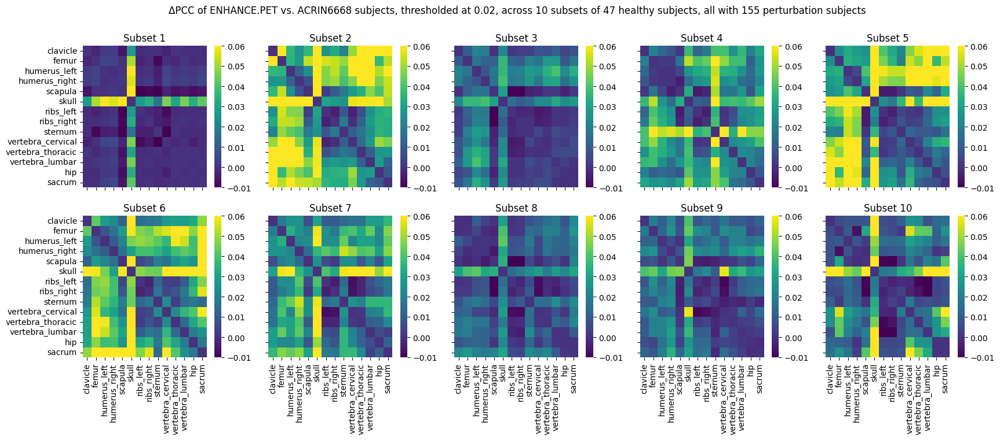

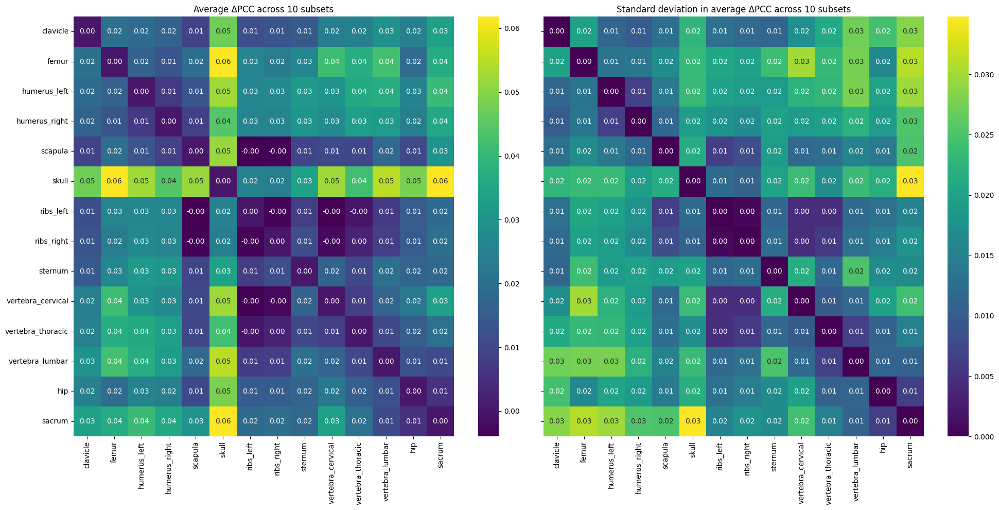

Shuffled healthy dataset for random subset selection
Healthy vs Healthy Analysis, 47 healthy subjects per subset, 10 subsets, threshold 0.02, 142 healthy subjects as perturbation, 3 repeats per subset
Range of average ΔPCC is (-0.0035, 0.0043)
Range of average ΔPCC is (-0.0035, 0.0043)
Range of average ΔPCC is (-0.0035, 0.0043)
Range of average ΔPCC is (-0.0069, 0.0075)
Range of average ΔPCC is (-0.0069, 0.0075)
Range of average ΔPCC is (-0.0069, 0.0075)
Range of average ΔPCC is (-0.0041, 0.0064)
Range of average ΔPCC is (-0.0041, 0.0064)
Range of average ΔPCC is (-0.0041, 0.0064)
Range of average ΔPCC is (-0.0055, 0.0034)
Range of average ΔPCC is (-0.0055, 0.0034)
Range of average ΔPCC is (-0.0055, 0.0034)
Range of average ΔPCC is (-0.0026, 0.0117)
Range of average ΔPCC is (-0.0026, 0.0117)
Range of average ΔPCC is (-0.0026, 0.0117)
Range of average ΔPCC is (-0.0026, 0.0056)
Range of average ΔPCC is (-0.0026, 0.0056)
Range of average ΔPCC is (-0.0026, 0.0056)
Range of average ΔPCC is 

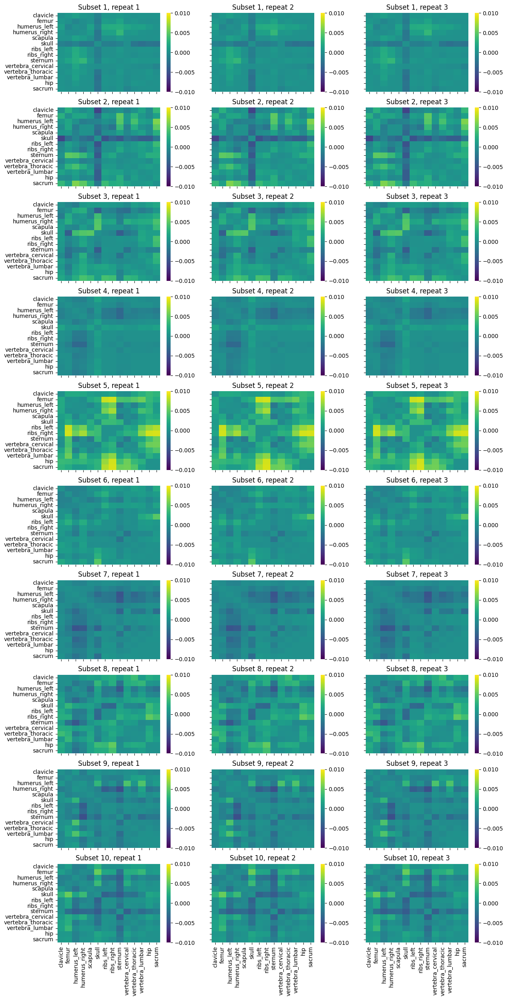

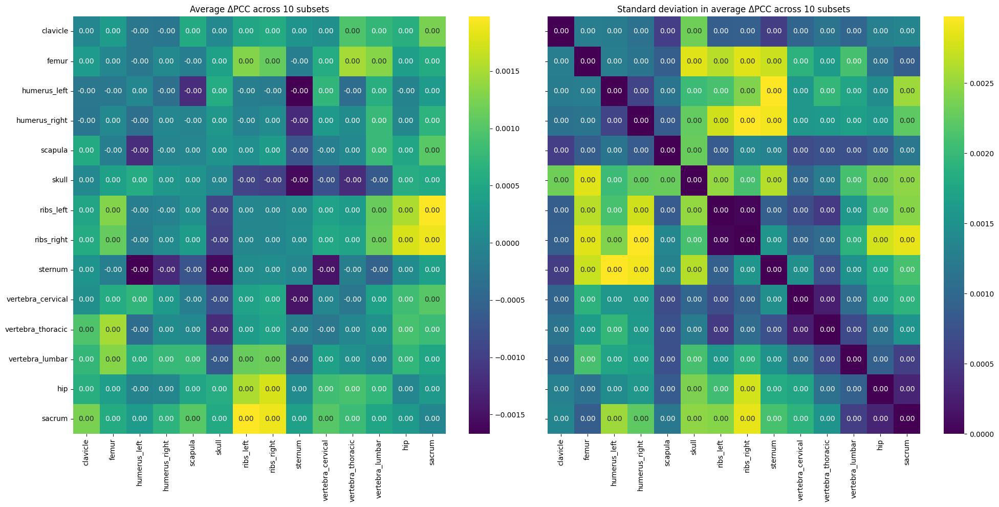

In [ ]:
# This version randomises the subsets and repeats, to see if there was a trend in the organisation of the ENHANCE.PET dataset affecting the previous results
def Enhance_errors_random(enhance_filename, pretreat_filename, bones_only, drop_adrenals, n, threshold, repeats, include_acrin=True, m=0, m_repeats=1):
    enhance_df = GetDF(enhance_filename, ['Patient ID'], bones_only=bones_only, drop_adrenals=drop_adrenals, enhance=True)
    shuffled_df = enhance_df.sample(frac=1) # Shuffle the healthy dataset to get random subsets each time
    
    print("Shuffled healthy dataset for random subset selection")

    if include_acrin:
        print(f"Healthy vs NSCLC Analysis, {n} healthy subjects per subset, {repeats} subsets, threshold {threshold}")

        acrin_df = GetDF(pretreat_filename, ['Patient ID'], bones_only=bones_only, drop_adrenals=drop_adrenals, enhance=True)
        perturb_df=acrin_df
        print(f"{len(perturb_df)} subjects in perturbation dataset")
        fig, axes = plt.subplots(repeats//5, repeats//2, figsize=(20, 7), sharex=True, sharey=True)
        
        repeats_list = []

        for i in range(repeats):
            # print(f"Subset {i+1}:")
            refnet_subset = shuffled_df.iloc[i*n:(i+1)*n]
            # print(len(refnet_subset))
            refnet = Refnet(refnet_subset)
            mean_refnet = refnet.values.flatten().mean()
            std_refnet = refnet.values.flatten().std()
            # print(f"Refnet PCC Mean: {mean_refnet:.4f}, SD: {std_refnet:.4f}")

            enhance_subset_resnet_list, enhance_subset_avgresnet, vmin, vmax = Perturbation(refnet_subset, refnet, perturb_df)
            enhance_subset_avgresnet_stacked = enhance_subset_avgresnet.stack()
            mean = enhance_subset_avgresnet_stacked.mean()
            std = enhance_subset_avgresnet_stacked.std()
            abs_mean = enhance_subset_avgresnet_stacked.abs().mean()
            abs_std = enhance_subset_avgresnet_stacked.abs().std()
            # print(f"{delta}PCC Mean: {mean:.4f}, SD: {std:.4f}, Absolute Mean: {abs_mean:.4f}, Absolute SD: {abs_std:.4f}")
            enhance_subset_resnet_masked_list = []
            for j, resnet in enumerate(enhance_subset_resnet_list):
                mask = resnet.abs() > threshold
                masked_resnet = resnet.where(mask, other=0)
                enhance_subset_resnet_masked_list.append(masked_resnet)
            enhance_subset_avgresnet_masked = sum(enhance_subset_resnet_masked_list) / len(enhance_subset_resnet_masked_list)
            repeats_list.append(enhance_subset_avgresnet_masked)
            sns.heatmap(enhance_subset_avgresnet_masked, cbar=True, yticklabels=True, xticklabels=True, cmap=palette, ax=axes.flat[i], vmin=-0.01, vmax=0.06)
            axes.flat[i].set_title(f'Subset {i+1}')

        plt.suptitle(f'{delta}PCC of ENHANCE.PET vs. ACRIN6668 subjects, thresholded at {threshold}, across {repeats} subsets of {n} healthy subjects, all with {len(perturb_df)} perturbation subjects')
        plt.show()
        plt.close()

    else:
        print(f"Healthy vs Healthy Analysis, {n} healthy subjects per subset, {repeats} subsets, threshold {threshold}, {m} healthy subjects as perturbation, {m_repeats} repeats per subset")
        
        fig, axes = plt.subplots(repeats, m_repeats, figsize=(14, 30), sharex=True, sharey=True)

        repeats_list = []

        for i in range(repeats):
            refnet_subset = shuffled_df.iloc[i*n:(i+1)*n]
            refnet = Refnet(refnet_subset)
            mean_refnet = refnet.values.flatten().mean()
            std_refnet = refnet.values.flatten().std()
            # print(f"Refnet PCC Mean: {mean_refnet:.4f}, SD: {std_refnet:.4f}")

            for k in range(m_repeats):
                perturb_pool = pd.concat([shuffled_df.iloc[:i*n], shuffled_df.iloc[(i+1)*n:]])
                perturb_df = perturb_pool.iloc[:m]
                # print(len(perturb_df))

                one_subset_resnet_list, one_subset_avgresnet, vmin, vmax = Perturbation(refnet_subset, refnet, perturb_df)
                enhance_subset_avgresnet_stacked = one_subset_avgresnet.stack()
                mean = enhance_subset_avgresnet_stacked.mean()
                std = enhance_subset_avgresnet_stacked.std()
                abs_mean = enhance_subset_avgresnet_stacked.abs().mean()
                abs_std = enhance_subset_avgresnet_stacked.abs().std()
                # print(f"{delta}PCC Mean: {mean:.4f}, SD: {std:.4f}, Absolute Mean: {abs_mean:.4f}, Absolute SD: {abs_std:.4f}")
                enhance_subset_resnet_masked_list = []
                for j, resnet in enumerate(one_subset_resnet_list):
                    mask = resnet.abs() > threshold
                    masked_resnet = resnet.where(mask, other=0)
                    enhance_subset_resnet_masked_list.append(masked_resnet)
                enhance_subset_avgresnet_masked = sum(enhance_subset_resnet_masked_list) / len(enhance_subset_resnet_masked_list)
                repeats_list.append(enhance_subset_avgresnet_masked)
                sns.heatmap(enhance_subset_avgresnet_masked, cbar=True, yticklabels=True, xticklabels=True, cmap=palette, ax=axes.flat[m_repeats*i+k], vmin=-0.01, vmax=0.01)
                axes.flat[m_repeats*i+k].set_title(f'Subset {i+1}, repeat {k+1}')

    subset_repeats_avg = sum(repeats_list) / len(repeats_list)

    stacked = pd.concat(repeats_list, keys=range(len(repeats_list)))
    # print(stacked)
    subset_repeats_stdev = stacked.groupby(level=1, sort=False).std()
    # print(subset_repeats_stdev)

    fig, ax = plt.subplots(1, 2, figsize=(20,10), sharex=True, sharey=True)
    sns.heatmap(subset_repeats_avg, cbar=True, yticklabels=True, xticklabels=True, cmap=palette, ax=ax[0], annot=True, fmt='.2f')
    ax[0].set_title(f'Average {delta}PCC across {repeats} subsets')
    sns.heatmap(subset_repeats_stdev, cbar=True, yticklabels=True, xticklabels=True, cmap=palette, ax=ax[1], annot=True, fmt='.2f')
    ax[1].set_title(f'Standard deviation in average {delta}PCC across {repeats} subsets')
    fig.tight_layout()
    plt.show()
    plt.close()

Enhance_errors_random(enhance_filename, pretreat_filename, True, True, 47, 0.02, 10)
Enhance_errors_random(enhance_filename, pretreat_filename, True, True, 47, 0.02, 10, False, m=142, m_repeats=3)